In [1]:
### we use this notebook to fully debug issues we see in the training data...
### TODO we need to represent the IS GAME STARTED flag... else it might try and just swap...
### and we cannot tell from the tensor whether the game has started or not?
### Do we try and mitigate this some other way?

# for more efficiently permuting the indices of the tensor to account for active and passive swapping:
PERM_INDEX = [
    ### board:
    0, 1, 2, 3, 4, 5,
    12, 13, 14, 15, 16, 17,
    6, 7, 8, 9, 10, 11,

    ### color orders:
    24, 25, 26, 27, 28, 29,
    18, 19, 20, 21, 22, 23,

    ### bowl tokens:
    36, 37, 38, 39, 40, 41,
    30, 31, 32, 33, 34, 35,

    ### is no more placing:
    42,

    ### score:
    44,
    43,

    ### current bowl token value:
    46,
    45,
]

from int_to_board import loci, locj

In [2]:

from importlib import reload
import random
import torch
import os
import numpy as np
import copy
from pathlib import Path
import matplotlib.pyplot as plt
import datetime
import pickle

import game
reload(game)

import trainer
reload(trainer)

import mcts.networks
reload(mcts.networks)

import mcts.mcts
reload(mcts.mcts)

import augmentor
reload(augmentor)

from game import Patterns
from trainer import PatternTrainer
from mcts.mcts import Node, Tree
from mcts.networks import PatternsNet
from plotting import PatternPlotter
from augmentor import StateAugmentor

rseed = 12387623
random.seed(rseed)
torch.manual_seed(rseed)
np.random.seed(rseed)

my_device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")


In [11]:
"""
to test the new version of the mcts tensor state creator, we need to be able 
to check it creates accurate games.
So I will set up a randomly playing mcts agent, and take it step by step
"""
network_path = os.path.join(Path.cwd(), 'saved_networks', 'v4', '2025_07_11_15_25.pt')
my_network = PatternsNet(in_channels=47, out_channels=128)
my_network.load_state_dict(torch.load(network_path, weights_only=True))
my_network.to(my_device)

new_game = Patterns()

# assign new game to root node, along with breadth restriction params:
root_node = Node(
    game=new_game,
    breadth_restriction=10,
    random_restriction=5,
)

root_node.create_tensor_state()

# two head inference results:
with torch.inference_mode():
    value_stack, policy_stack = my_network(root_node.tensor_state[None].to(my_device, non_blocking=True))

value_stack = value_stack.to("cpu", non_blocking=True).numpy()
policy_stack = policy_stack.to("cpu", non_blocking=True).numpy()

root_node.value_score = value_stack[0]

# policy cannot be restricted just yet, as the game action space is not yet known:
root_node.full_policy = policy_stack[0]

# set visit count to avoid the expand step that seeks inference:
root_node.visit_count = 1

my_tree = Tree(
    root_node=root_node,
    tree_id=f"test_tree", 
    breadth_restriction=10,
    random_restriction=5,
    schedule=[(0, 0), (5, 200)],
)


In [12]:
# now set up an explore loop and check you are happy with it:
# run an exploration step for each tree. In particular, get leaf nodes:

count = 0

# play a full game:
while True:
    count += 1
    print(f"move number {count}")
    # explore a bunch:
    for it in range(50):
        leaf_node = my_tree.get_leaf_node()
        leaf_node = leaf_node.expand()

        leaf_node.create_tensor_state()
    
        # Do inference on the new leaf node tensor state:
        with torch.inference_mode():
            value_stack, policy_stack = my_network(leaf_node.tensor_state[None].float().to(my_device, non_blocking=True))
        
        value_stack = value_stack.to("cpu", non_blocking=True).numpy()
        policy_stack = policy_stack.to("cpu", non_blocking=True).numpy()
        
        leaf_node.value_score = value_stack[0]
        leaf_node.full_policy = policy_stack[0]
    
        my_tree.back_propagate(leaf_node)
    
    # then take a step forward:
    action_argument = my_tree.choose_action_argument()
    my_tree.step(action_argument)
    
    if my_tree.root_node.result is not None:
        break

move number 1
move number 2
move number 3
move number 4
move number 5
move number 6
move number 7
move number 8
move number 9
move number 10
move number 11
move number 12
move number 13
move number 14
move number 15
move number 16
move number 17
move number 18
move number 19
move number 20
move number 21
move number 22
move number 23
move number 24
move number 25
move number 26
move number 27
move number 28
move number 29


In [13]:
donottouch_node = copy.deepcopy(my_tree.root_node)

(49, 45)
[]


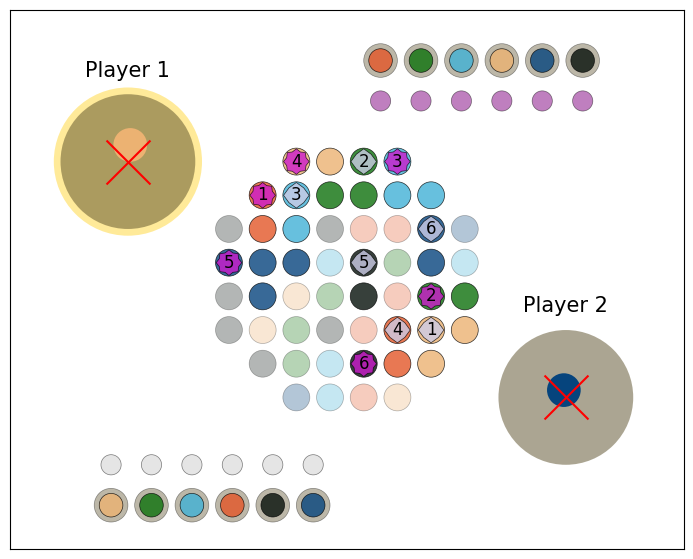

(43, 49)
[6, 14, 69, 83, 90]


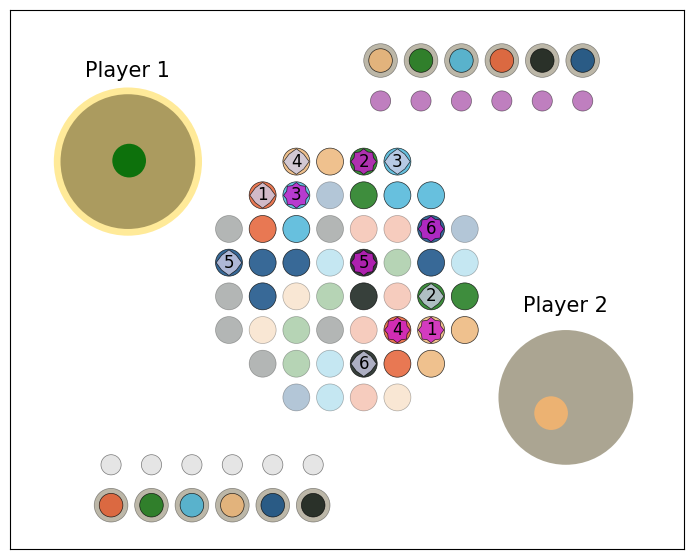

(48, 43)
[11]


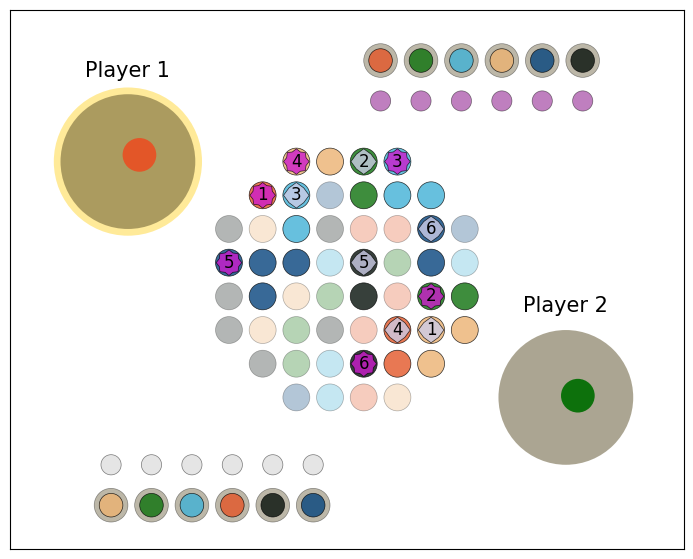

(37, 48)
[15, 17, 24, 83, 90]


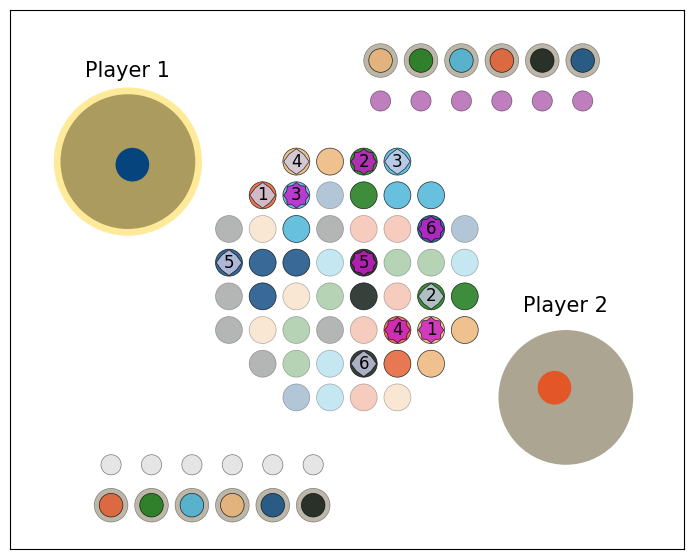

(43, 37)
[11, 18, 21, 26, 28, 35, 76]


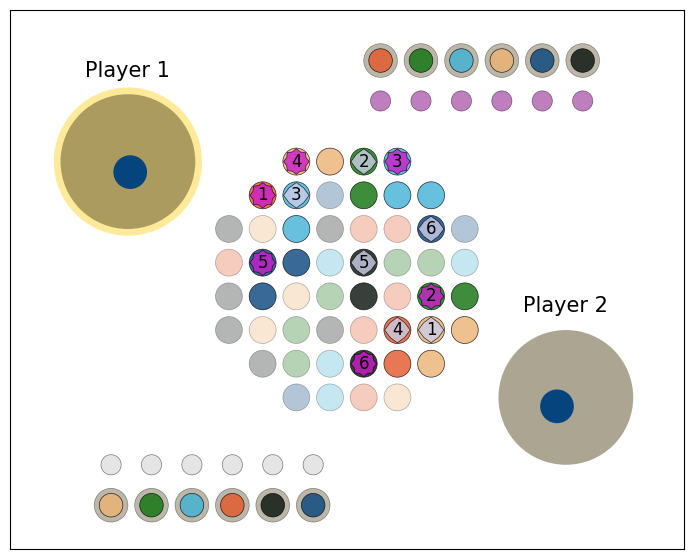

(36, 43)
[47, 69, 83, 90]


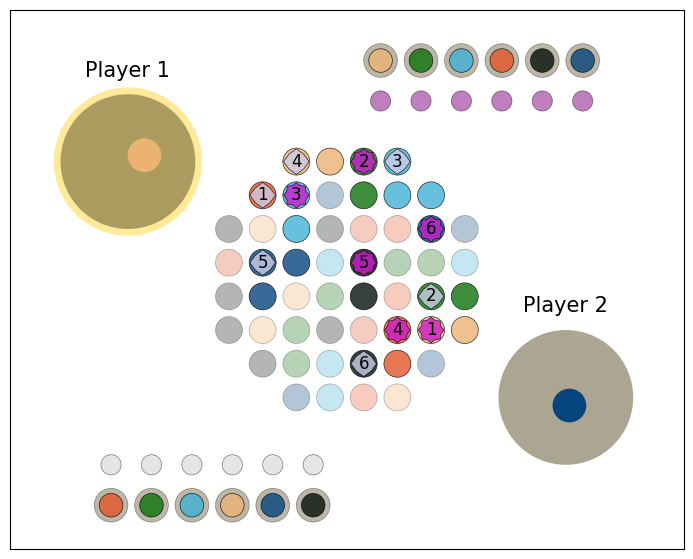

(40, 36)
[9, 15, 76]


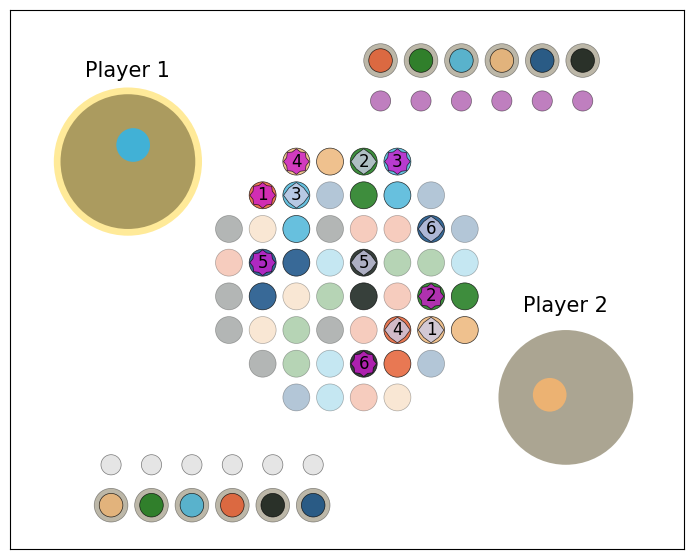

(33, 40)
[6, 12, 61, 69, 83, 90]


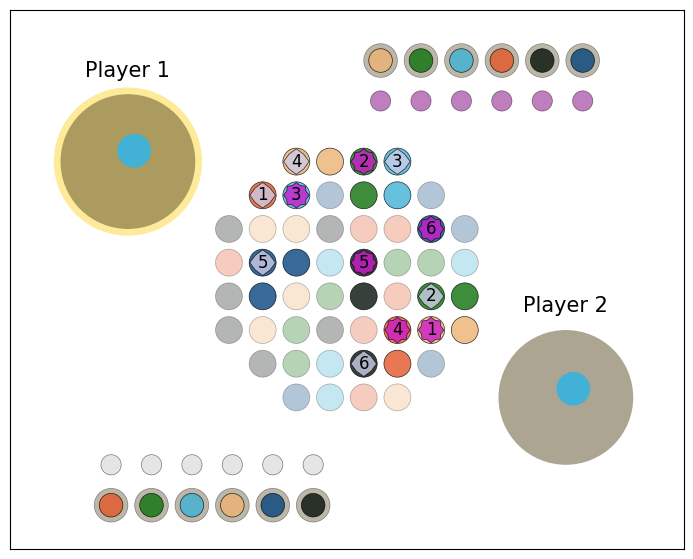

(34, 33)
[6, 9, 10, 11, 12, 13, 15, 17, 18, 24, 25, 26, 28, 34, 35, 36, 37, 42, 43, 44, 45, 47, 48, 49, 50, 51, 76]


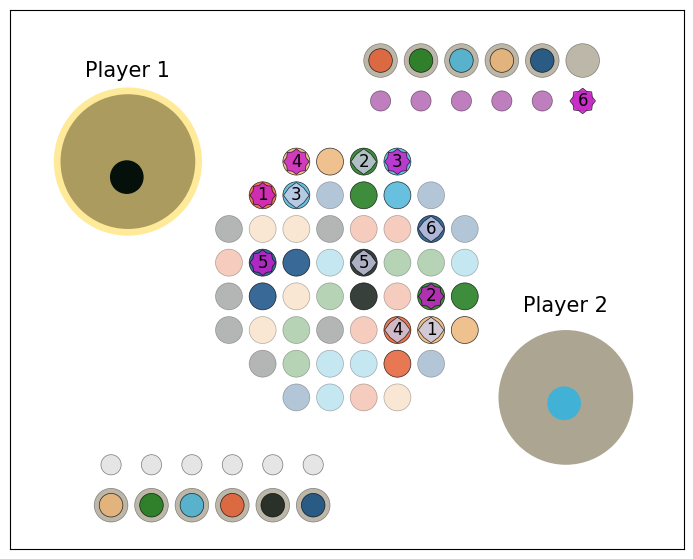

(32, 34)
[40, 61, 69, 83, 90]


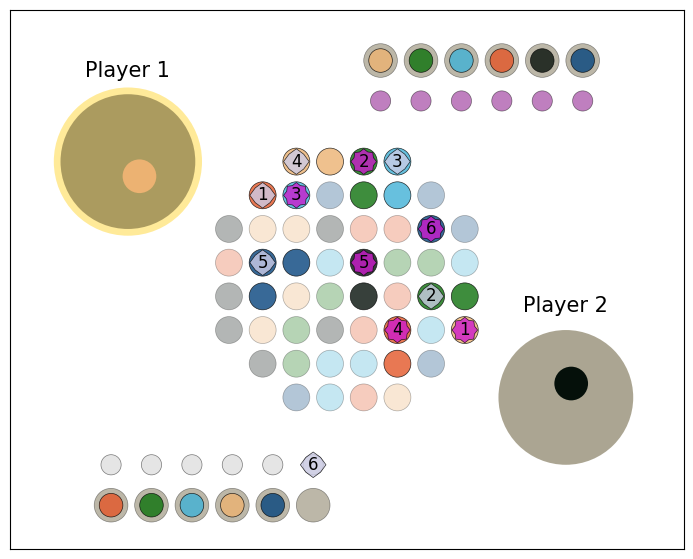

(29, 32)
[11, 18, 20, 26, 28, 35, 76]


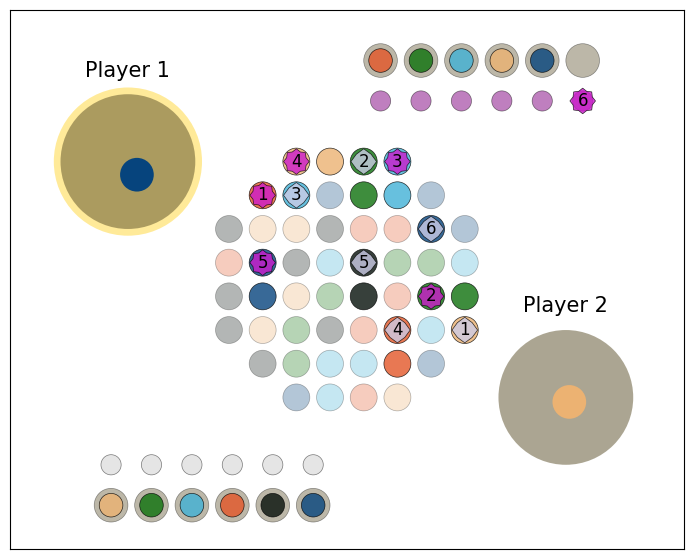

(26, 29)
[6, 9, 10, 12, 13, 14, 15, 16, 17, 21, 23, 24, 25, 29, 31, 34, 36, 37, 38, 40, 42, 43, 44, 45, 47, 48, 49, 50, 51, 83, 90]


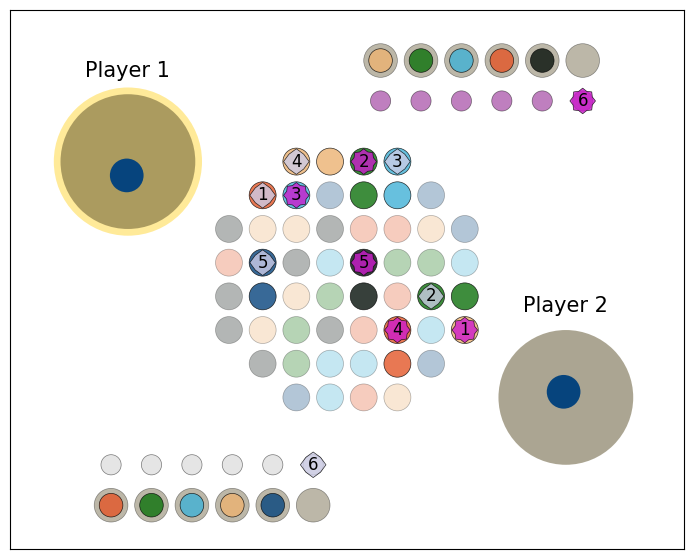

(24, 26)
[19, 26, 28, 35, 76]


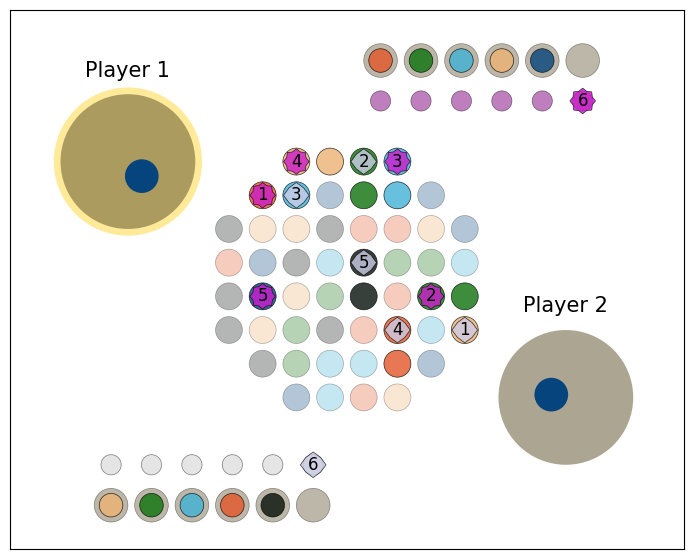

(21, 24)
[22, 29, 31, 38, 83, 90]


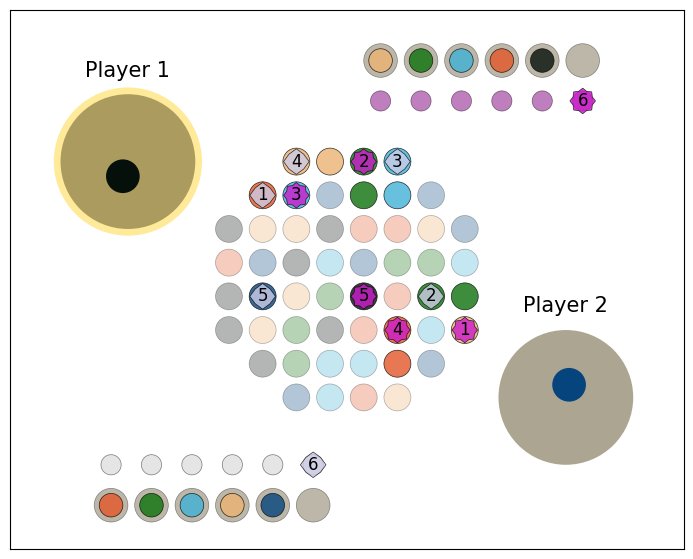

(22, 21)
[25, 32, 71]


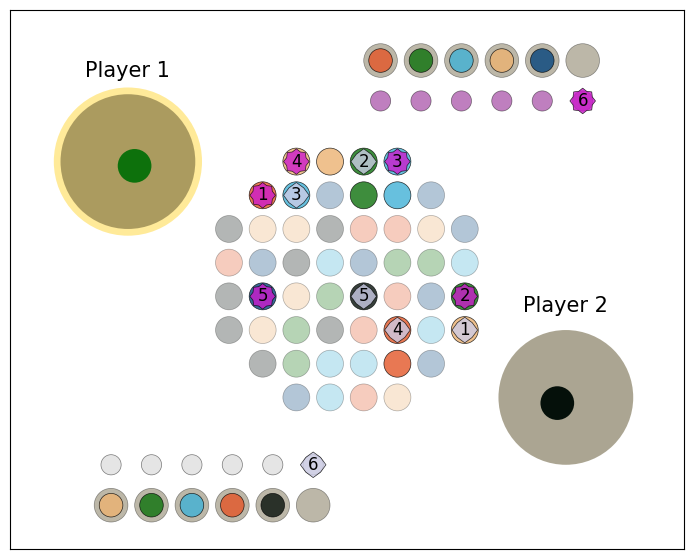

(16, 22)
[6, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 40, 42, 43, 44, 45, 47, 48, 49, 50, 51, 83, 90]


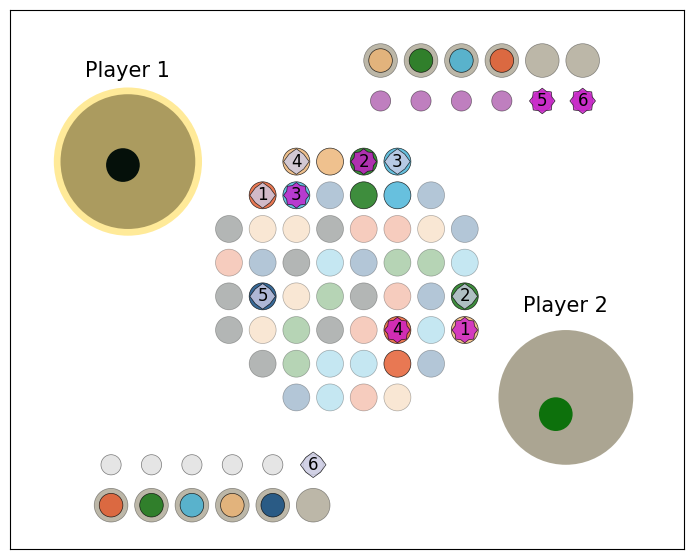

(17, 16)
[6, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 40, 42, 43, 44, 45, 47, 48, 49, 50, 51]


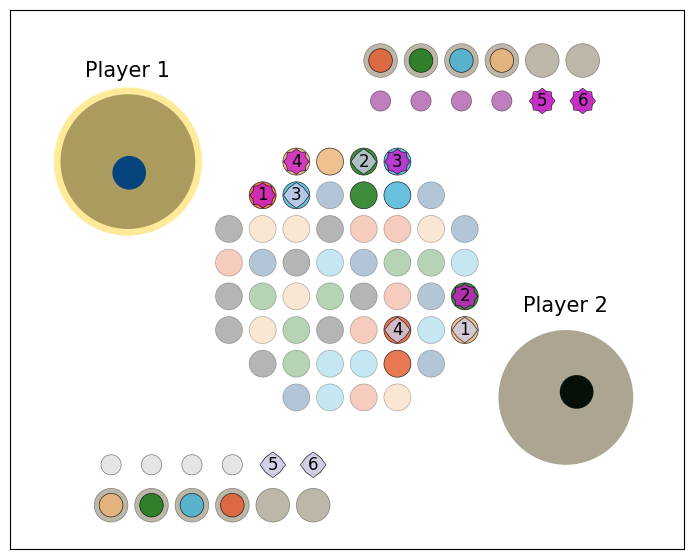

(12, 17)
[39, 45, 47, 51]


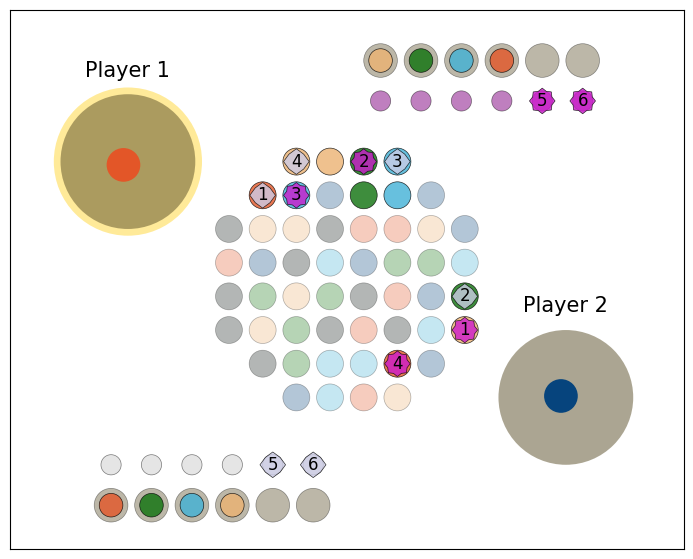

(13, 12)
[1]


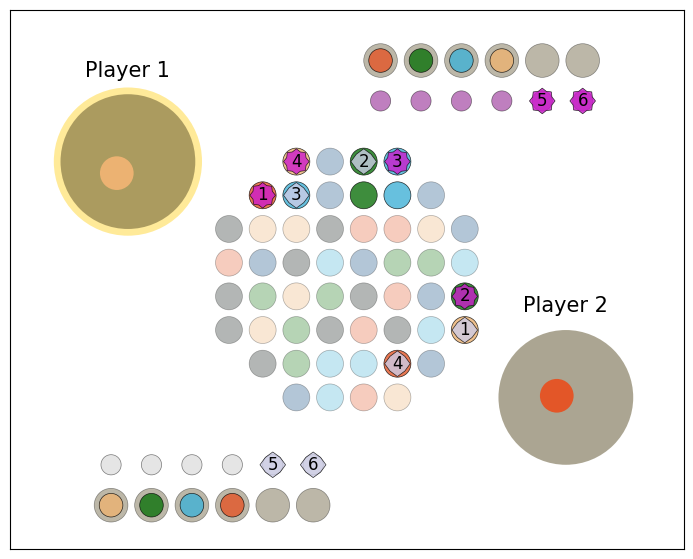

(10, 13)
[1, 7]


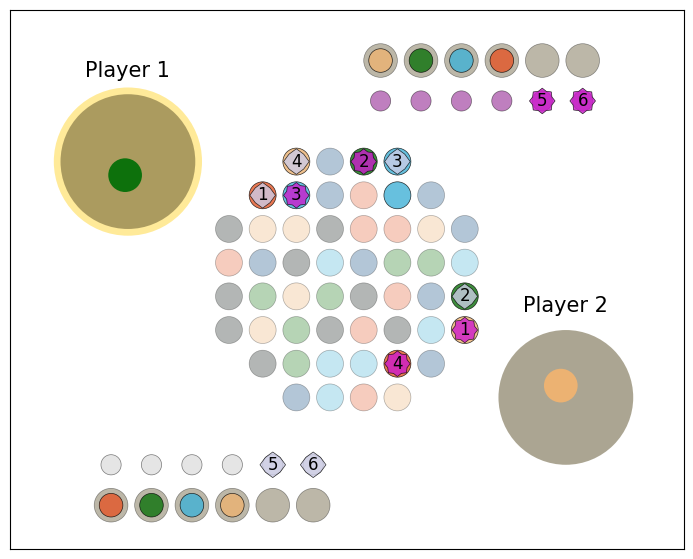

(10, 10)
[3, 7, 9, 15]


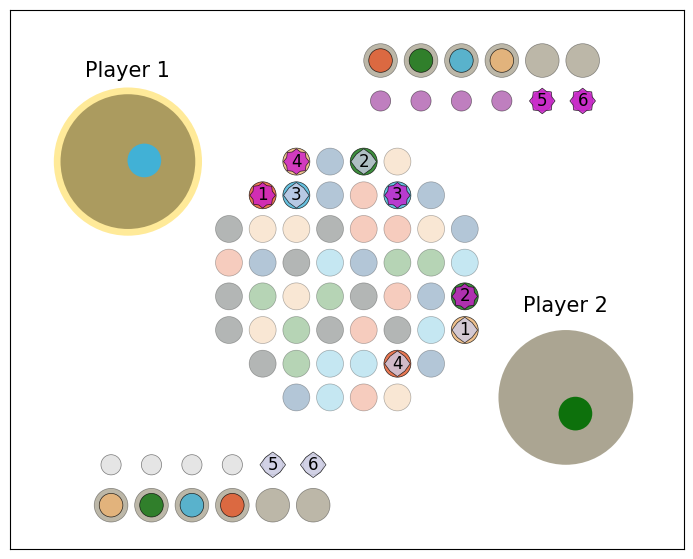

(6, 10)
[1, 3, 6, 7, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]


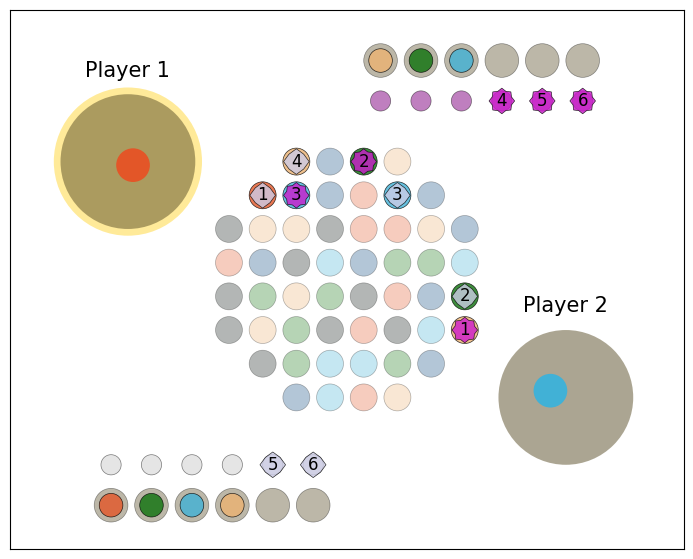

(6, 6)
[0, 1, 3, 6, 7, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]


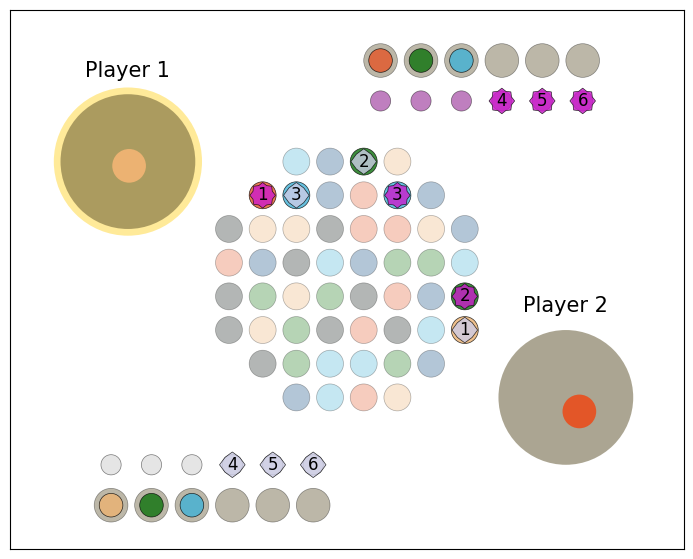

(3, 6)
[0, 1, 5, 6, 10, 11, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]


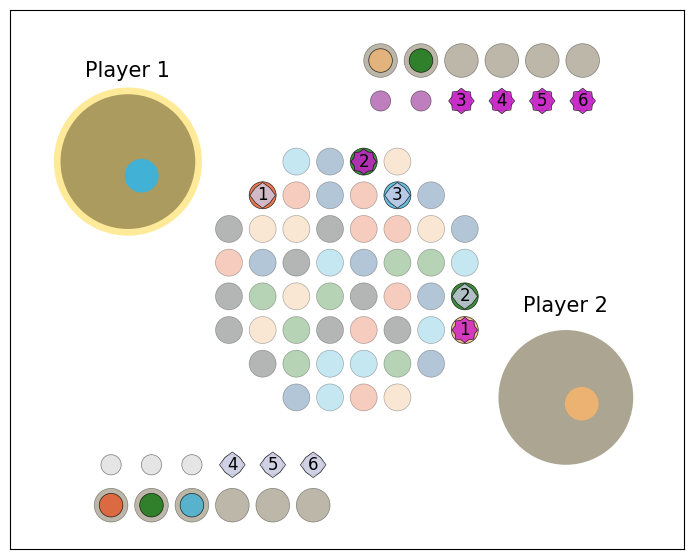

(3, 3)
[0, 1, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 57]


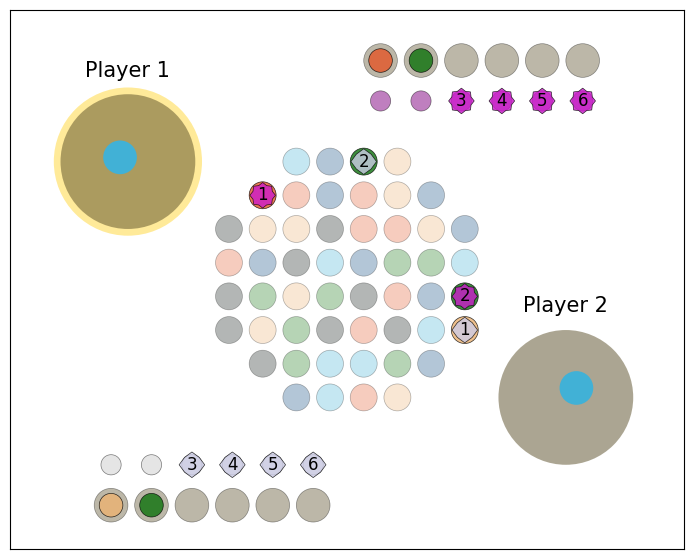

(1, 3)
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 30, 31, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]


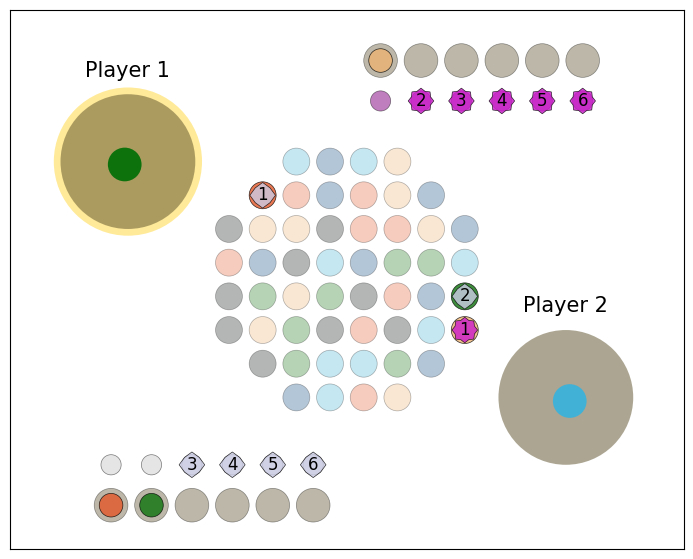

(1, 1)
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 57]


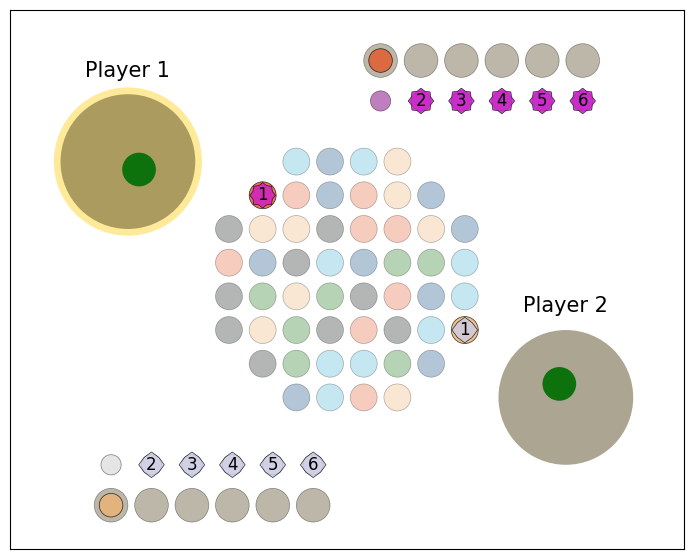

(0, 1)
[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]


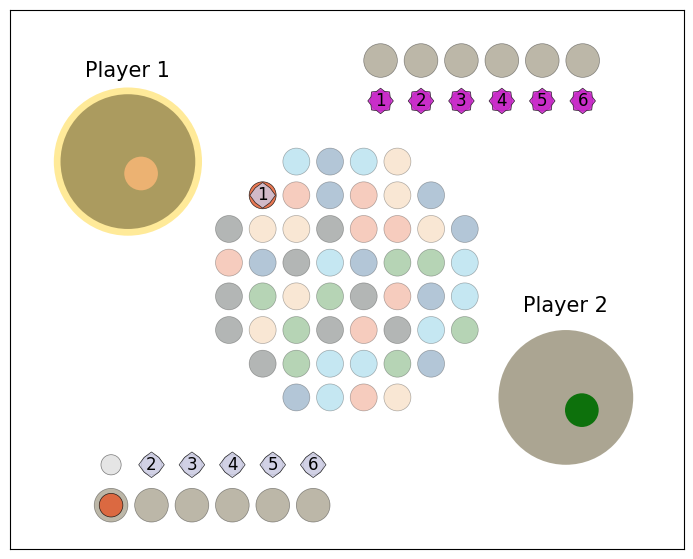

(0, 0)
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]


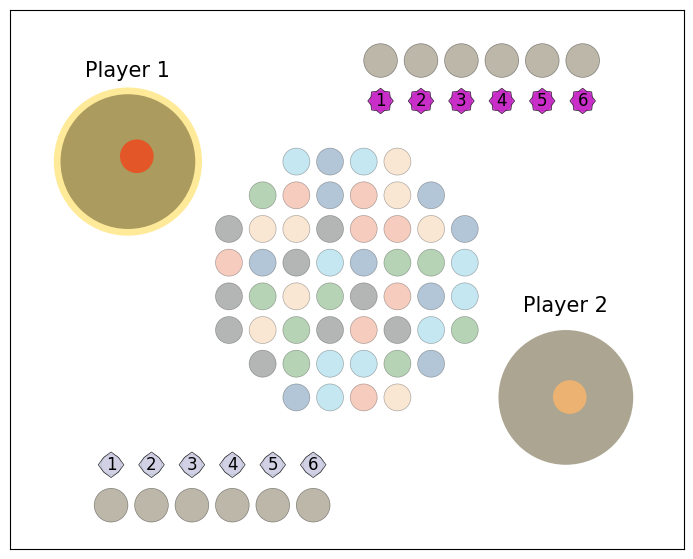

(0, 0)
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51]


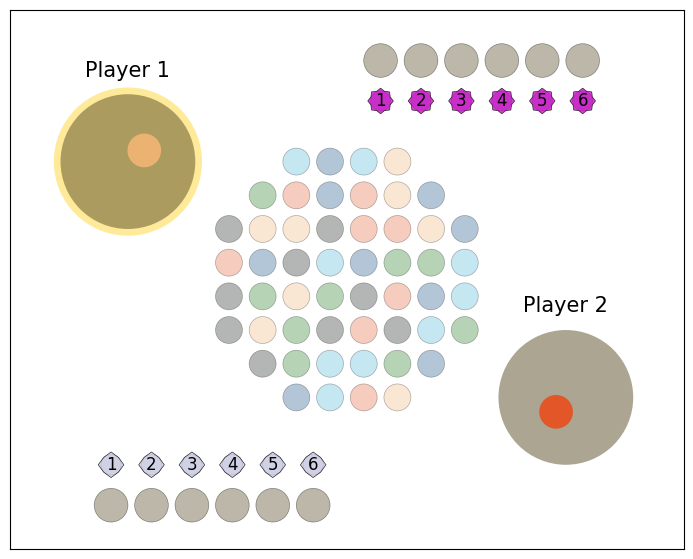

In [14]:
# now check what those tensor states look like!
_node = copy.deepcopy(donottouch_node)

while _node is not None:
    tensor_state = _node.tensor_state
    aug = StateAugmentor(state=tensor_state)
    new_game = aug.create_game_from_state()
    print(new_game.calculate_score())
    print(sorted(new_game.get_actions()))
    pplotter = PatternPlotter(new_game)
    pplotter.plot()
    _node = _node.parent


In [15]:
### okay it looks like we can make progress on the board just from the first one
_node = copy.deepcopy(donottouch_node)
parent_action_arguments = []

while _node.parent is not None:
    parent_action_arguments.append(_node.parent_action_arg)
    _node = _node.parent

In [16]:
donottouch_topnode = copy.deepcopy(_node)

In [17]:
def create_tensor_state(game) -> None:
    board = np.array(game.active_board)
    aorder = game.active_color_order
    porder = game.passive_color_order
    atoken = game.active_bowl_token
    ptoken = game.passive_bowl_token
    place_bool = game.is_no_more_placing
    acolgroups = game.active_color_groups
    pcolgroups = game.passive_color_groups
    EYE = torch.eye(19, dtype=torch.int)[:-1]  # shape (18, 19)

    ### Board tensor:
    board_tensor = EYE.index_select(1, torch.tensor(board).long().flatten())  # shape (18, 64)
    board_tensor = board_tensor.view(18, 8, 8)  # now in (C, H, W)

    ### Order tensor:
    order_list = [_or / 6.0 for _or in aorder + porder]
    order_tensor = torch.tensor(order_list).view(12, 1, 1).expand(12, 8, 8)

    ### Bowl tensor:
    bowl_list = [0] * 12
    bowl_list[atoken] = 1
    bowl_list[ptoken + 6] = 1
    bowl_tensor = torch.tensor(bowl_list).view(12, 1, 1).expand(12, 8, 8)

    ### Is no more placing flag tensor:
    placing_tensor = torch.tensor([int(place_bool)]).view(1, 1, 1).expand(1, 8, 8)

    ### Current score tensor:
    active_score = 0
    passive_score = 0

    for _col, (_aorder, _porder) in enumerate(zip(aorder, porder)):
        active_score += len(acolgroups[_col]) * _aorder
        passive_score += len(pcolgroups[_col]) * _porder

    score_tensor = torch.tensor([active_score / 150., passive_score / 150.]).view(2, 1, 1).expand(2, 8, 8)

    ### Bowl token value tensor:
    apnum, ppnum = 1, 1

    for _col, (_a, _p) in enumerate(zip(aorder, porder)):
        # increment for each time a color has been taken:
        if _a > 0:
            apnum += 1

        if _p > 0:
            ppnum += 1

    active_value = aorder[atoken] if aorder[atoken] != 0 else apnum
    passive_value = porder[ptoken] if porder[ptoken] != 0 else ppnum

    token_value_tensor = torch.tensor([active_value / 6.0, passive_value / 6.0]).view(2, 1, 1).expand(2, 8, 8)

    ### Stack the tensors:
    return torch.cat([board_tensor, order_tensor, bowl_tensor, placing_tensor,
                      score_tensor, token_value_tensor], dim=0)

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (0, 0)
Possible actions are: [104, 105, 106]
Action taken is: 104
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


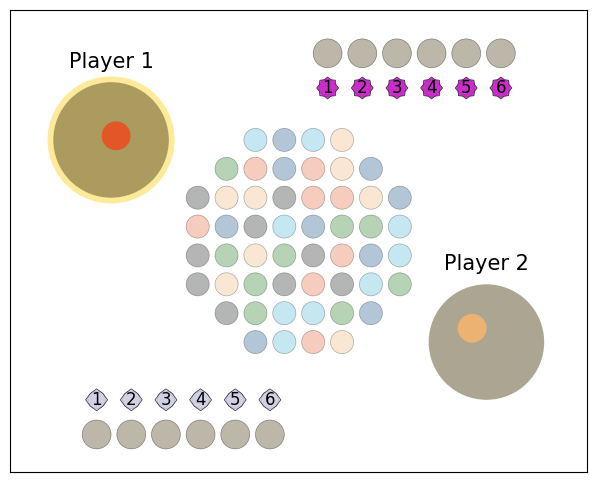

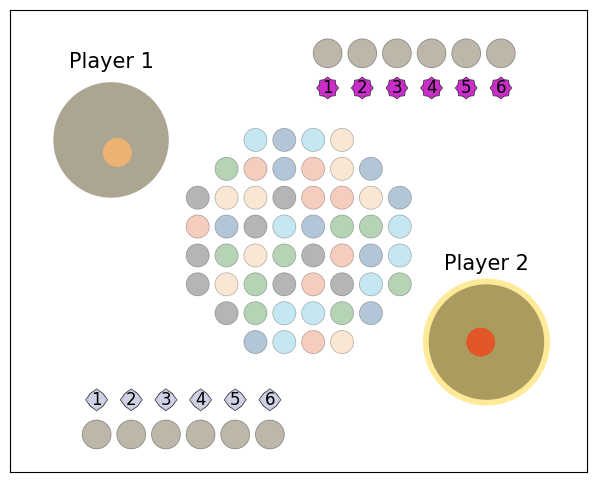

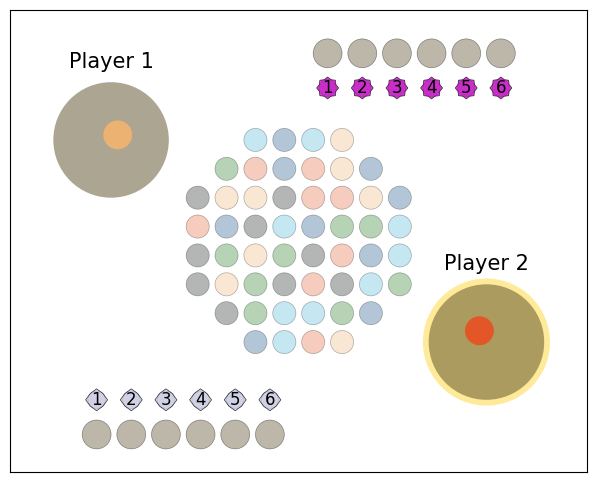

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (0, 0)
Possible actions are: [0, 2, 4, 10, 11, 13, 14, 22, 24, 28, 34, 36, 42, 43, 47]
Action taken is: 4
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


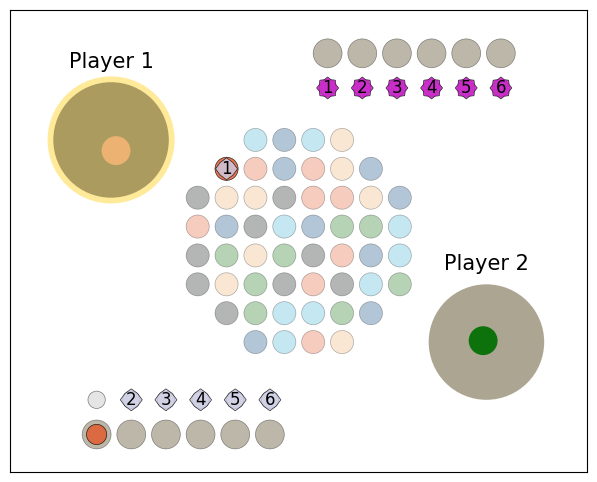

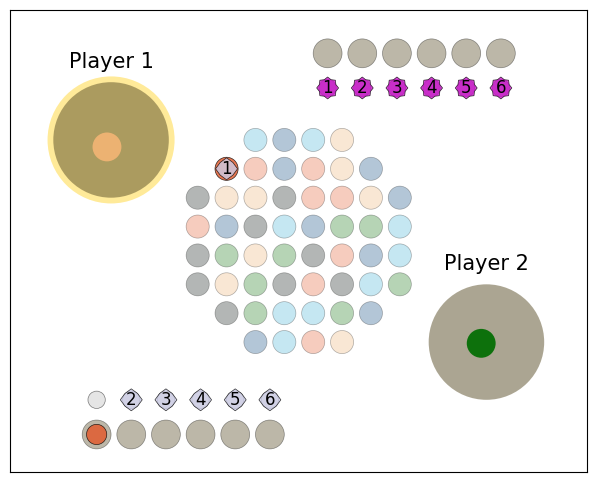

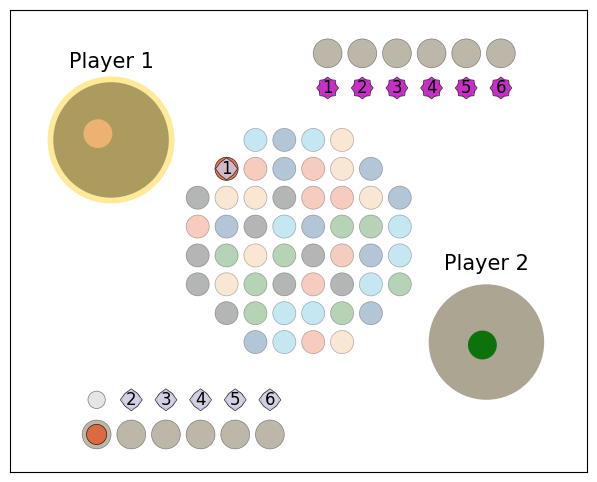

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (0, 1)
Possible actions are: [2, 6, 8, 10, 11, 14, 22, 24, 27, 34, 36, 39, 41, 42, 43]
Action taken is: 41
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


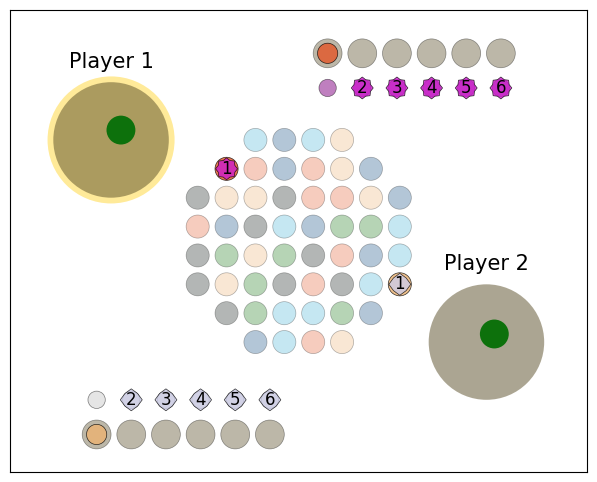

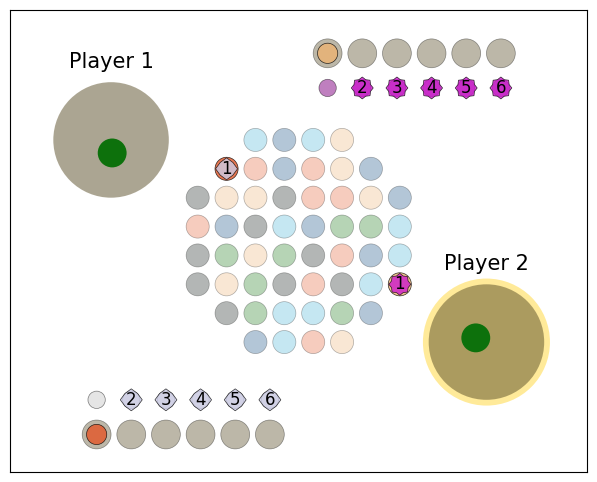

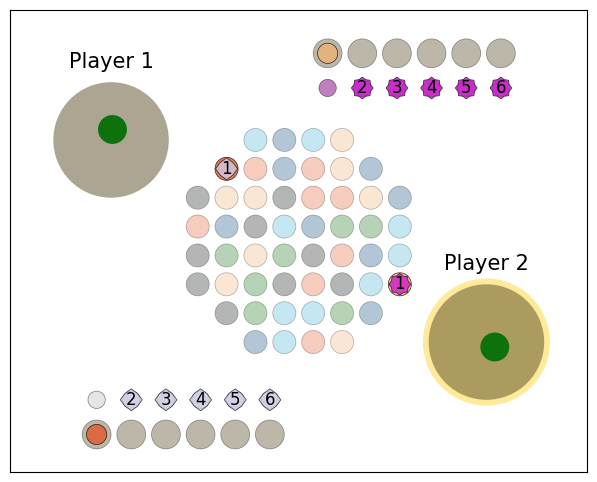

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (1, 1)
Possible actions are: [1, 2, 10, 11, 14, 17, 18, 28, 33, 34, 36, 42, 43, 51, 57]
Action taken is: 33
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


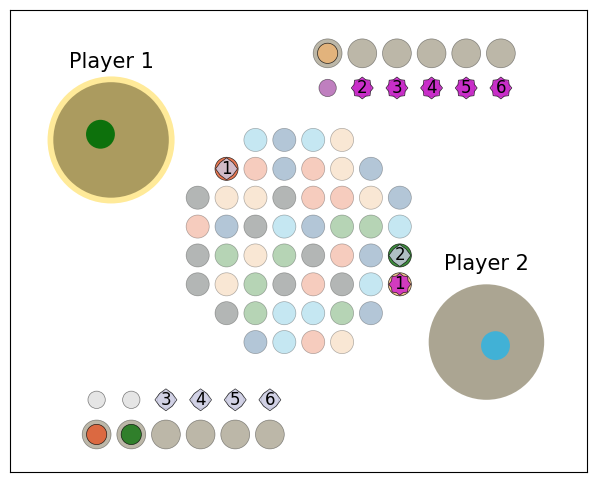

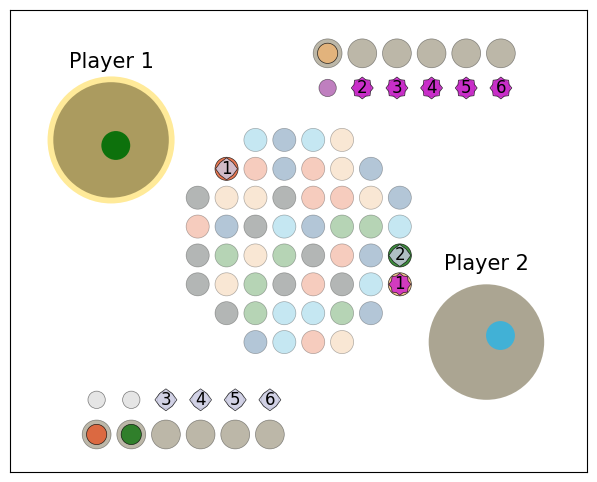

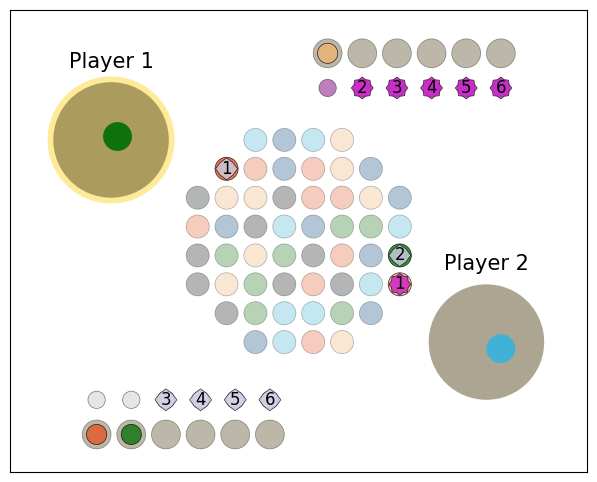

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (1, 3)
Possible actions are: [2, 10, 11, 13, 14, 16, 28, 34, 35, 36, 37, 42, 43, 46, 50]
Action taken is: 2
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


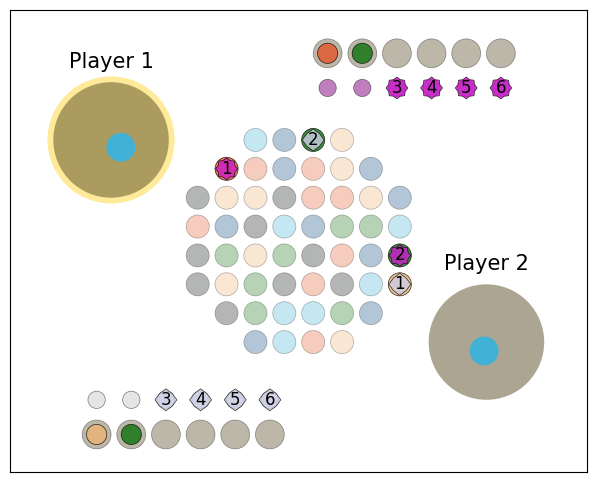

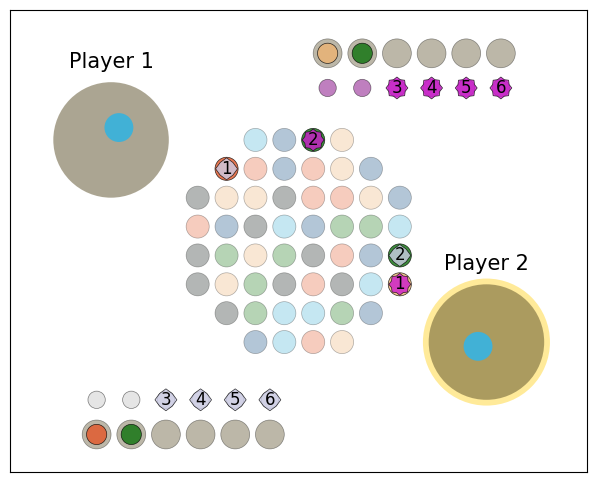

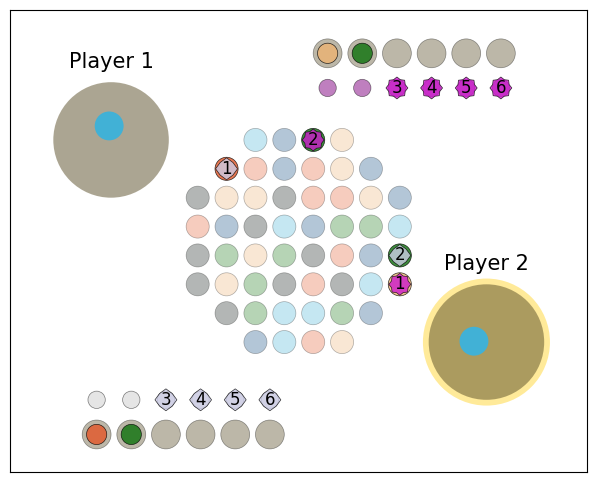

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (3, 3)
Possible actions are: [1, 7, 8, 10, 11, 14, 24, 28, 34, 35, 36, 42, 43, 45, 57]
Action taken is: 8
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


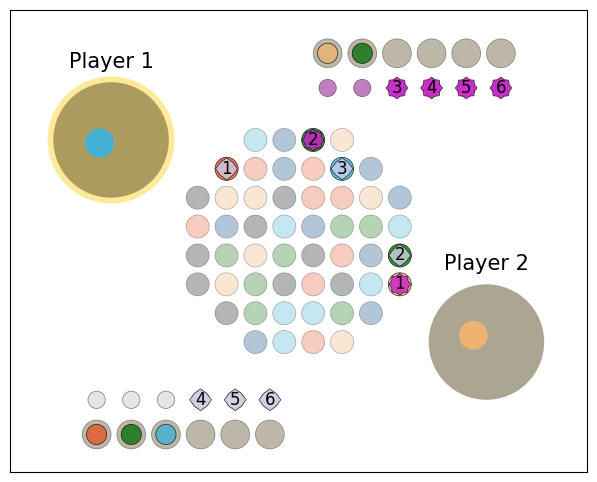

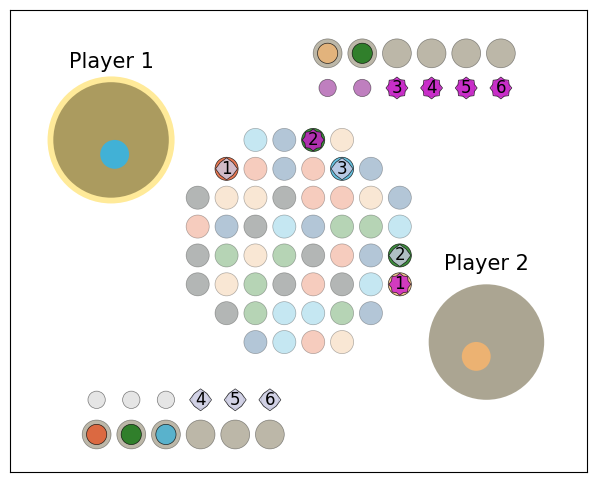

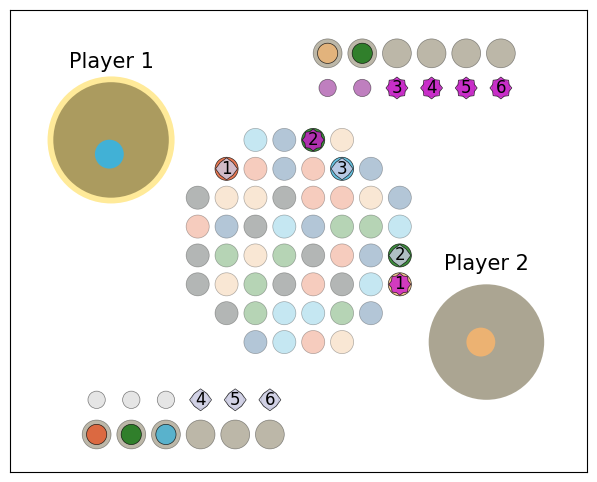

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (3, 6)
Possible actions are: [5, 10, 11, 12, 14, 24, 25, 28, 31, 34, 36, 42, 43, 47, 49]
Action taken is: 5
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


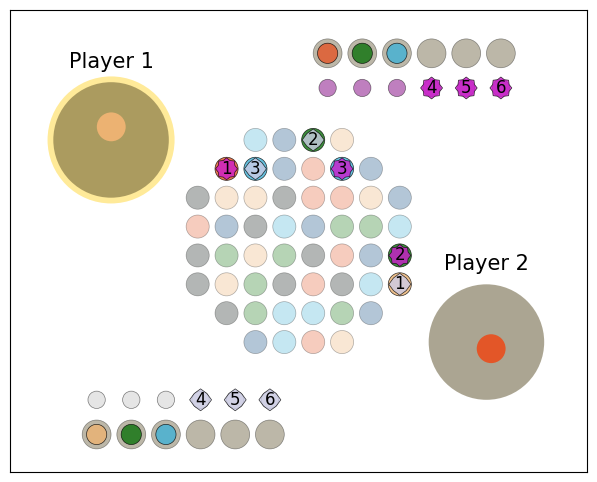

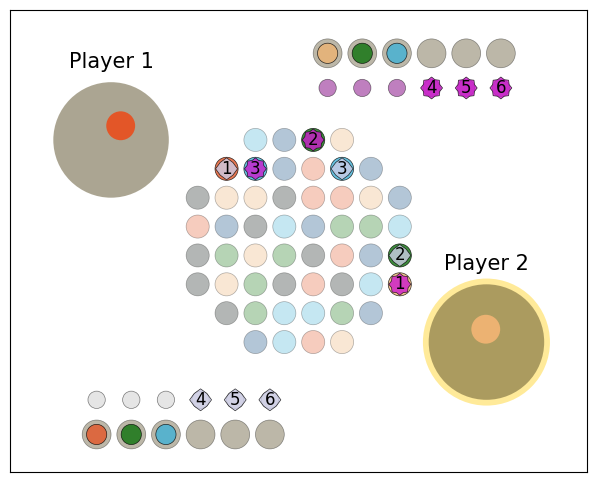

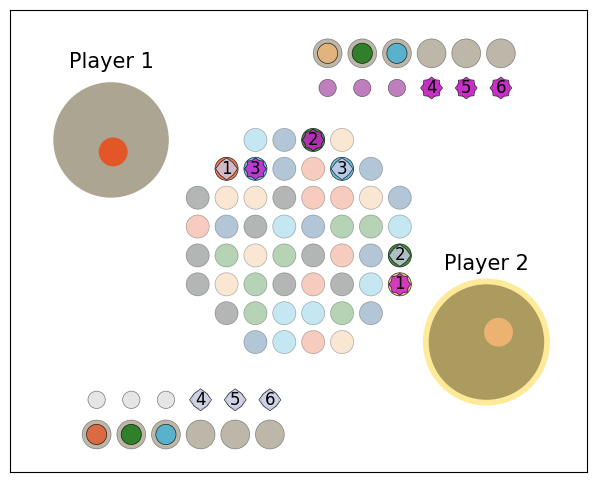

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (6, 6)
Possible actions are: [0, 7, 9, 10, 11, 12, 14, 24, 31, 34, 35, 36, 42, 43, 48]
Action taken is: 0
Difference in tensors is 4.76837158203125e-07
~~~~~~~~~~~~~~~~~~~~~~~~


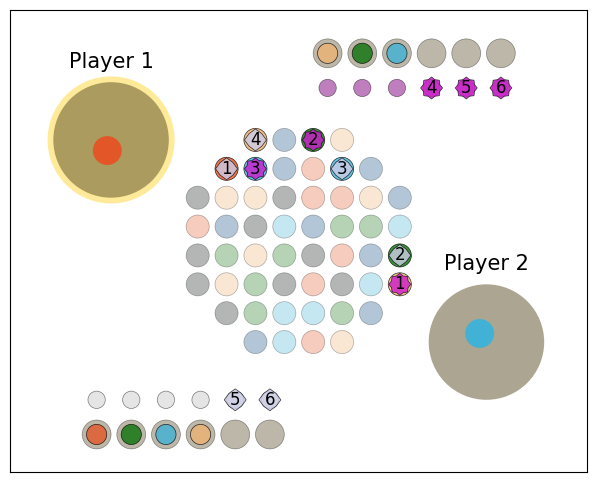

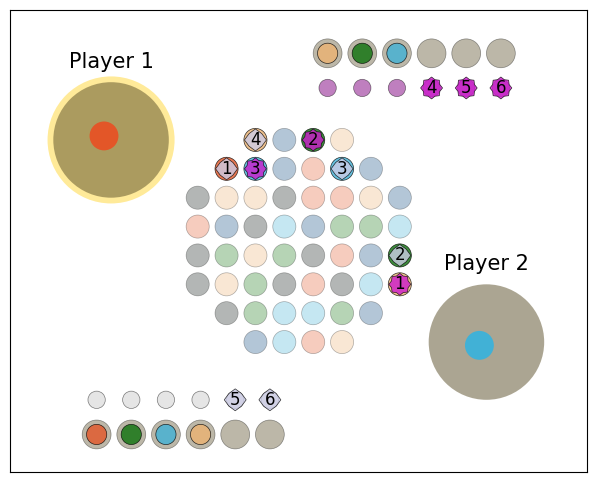

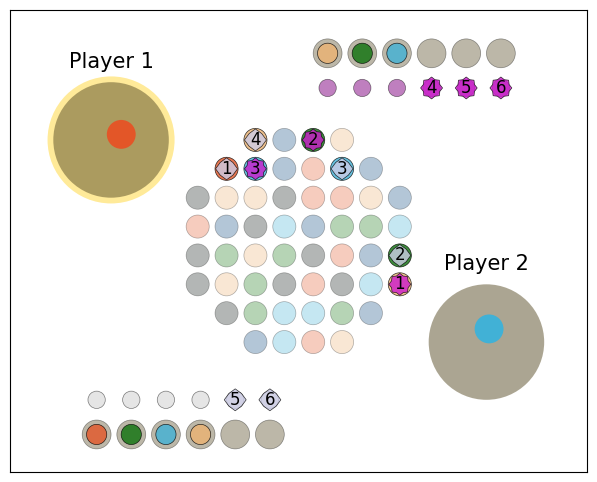

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (6, 10)
Possible actions are: [9, 10, 12, 14, 19, 24, 28, 31, 34, 35, 36, 42, 43, 44, 46]
Action taken is: 46
Difference in tensors is 9.5367431640625e-07
~~~~~~~~~~~~~~~~~~~~~~~~


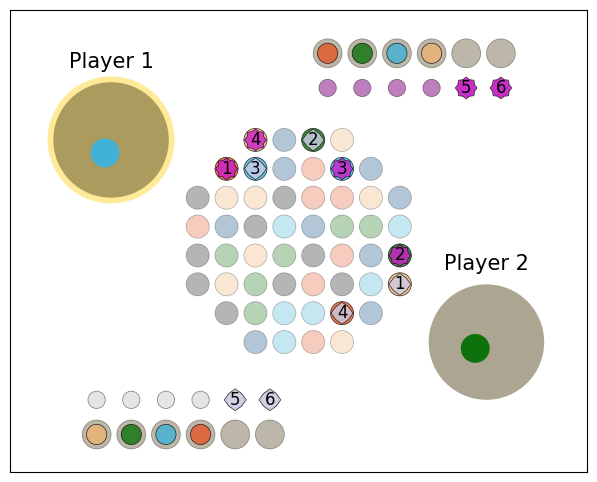

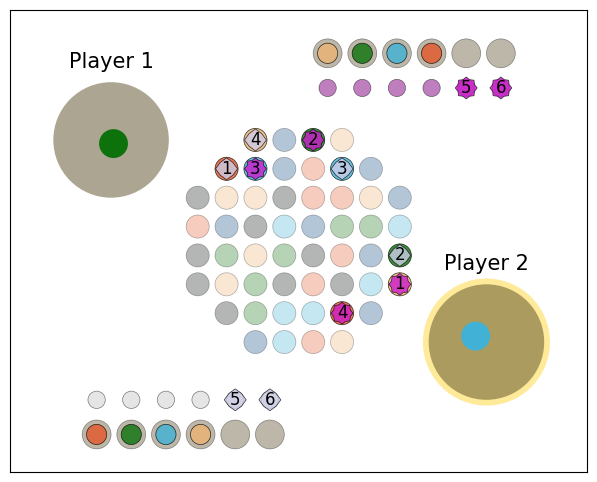

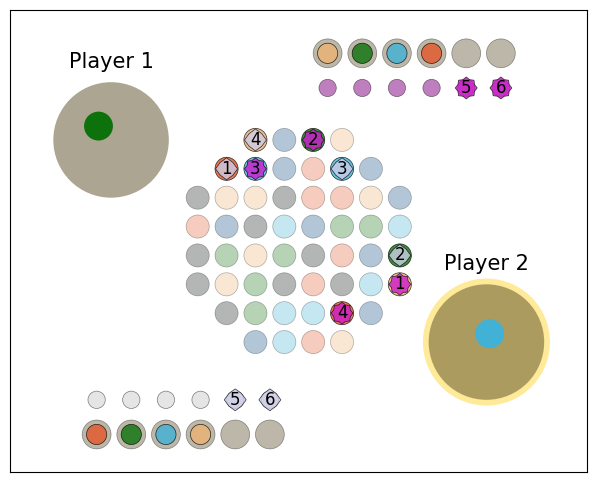

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (10, 10)
Possible actions are: [3, 7, 9, 15]
Action taken is: 3
Difference in tensors is 9.5367431640625e-07
~~~~~~~~~~~~~~~~~~~~~~~~


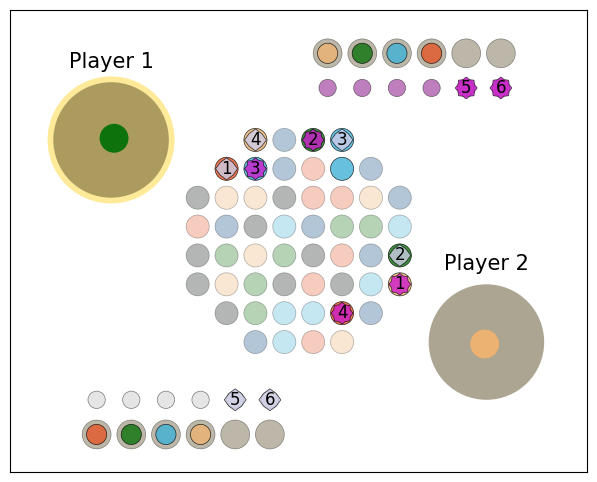

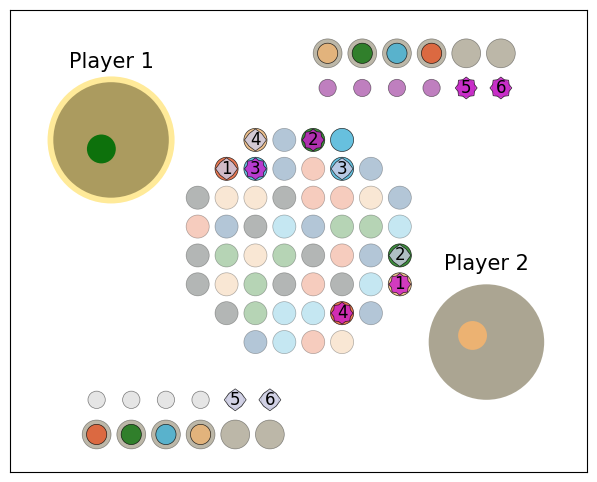

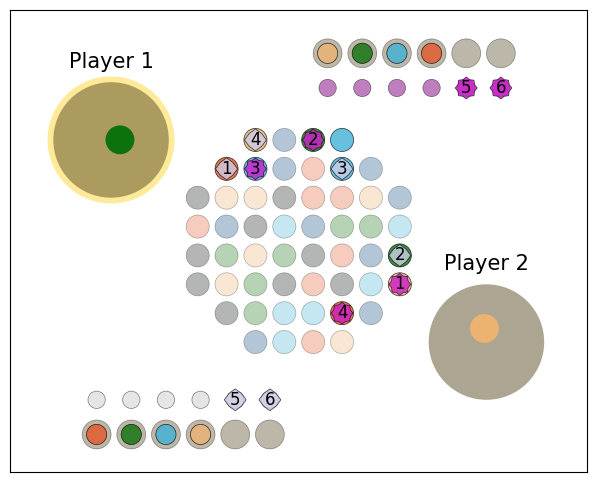

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (10, 13)
Possible actions are: [1, 7]
Action taken is: 7
Difference in tensors is 4.76837158203125e-07
~~~~~~~~~~~~~~~~~~~~~~~~


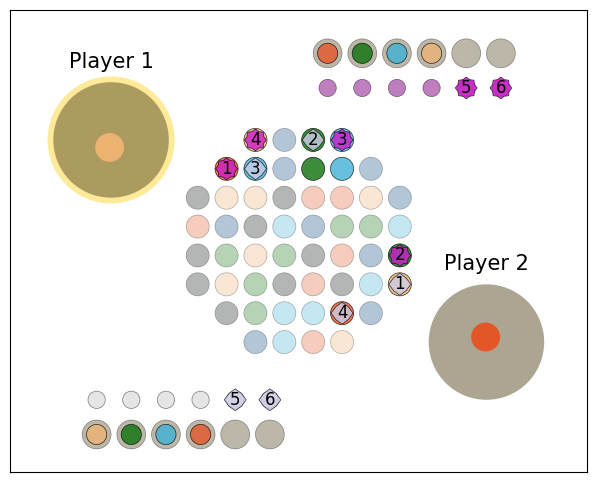

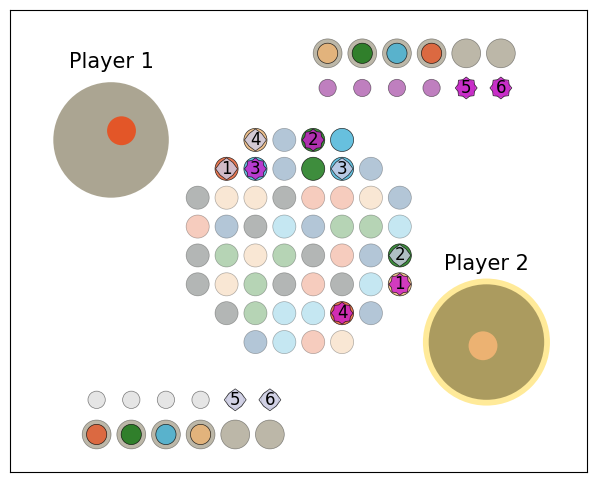

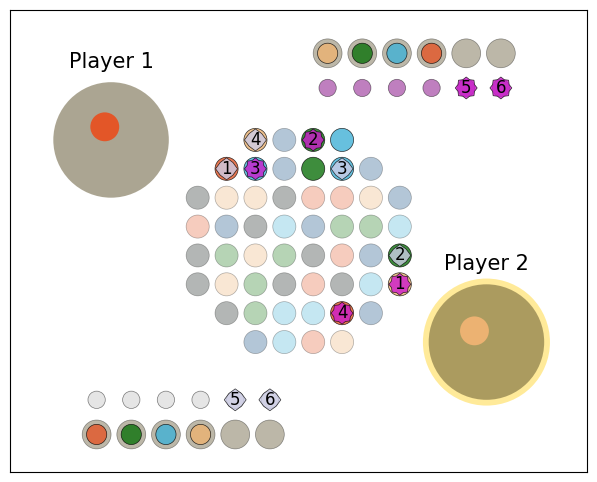

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (13, 12)
Possible actions are: [1]
Action taken is: 1
Difference in tensors is 4.76837158203125e-07
~~~~~~~~~~~~~~~~~~~~~~~~


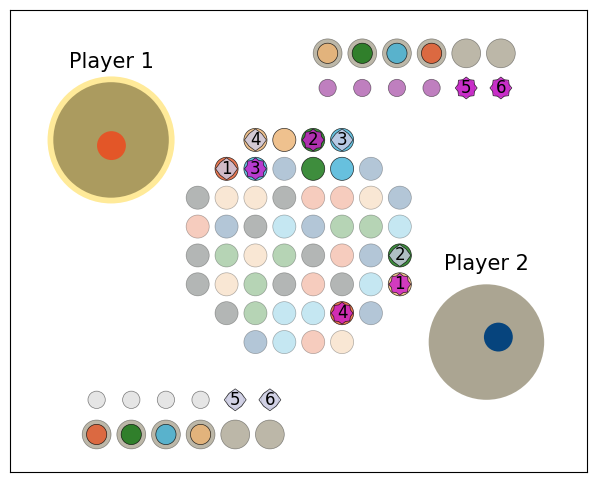

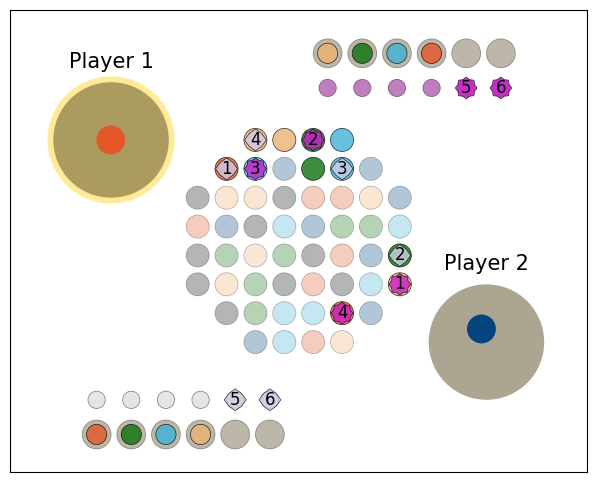

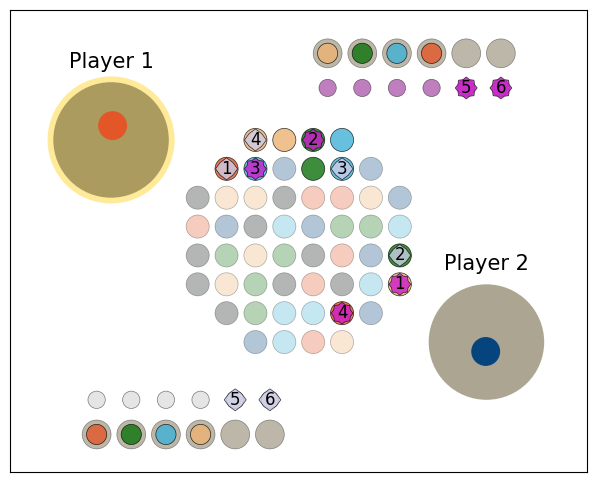

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (12, 17)
Possible actions are: [39, 45, 47, 51]
Action taken is: 39
Difference in tensors is 4.76837158203125e-07
~~~~~~~~~~~~~~~~~~~~~~~~


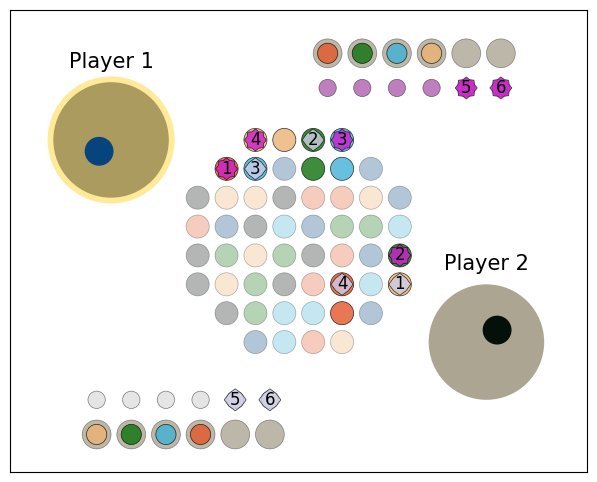

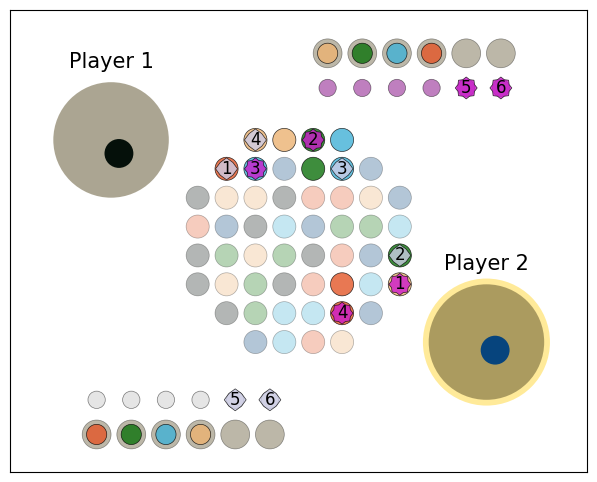

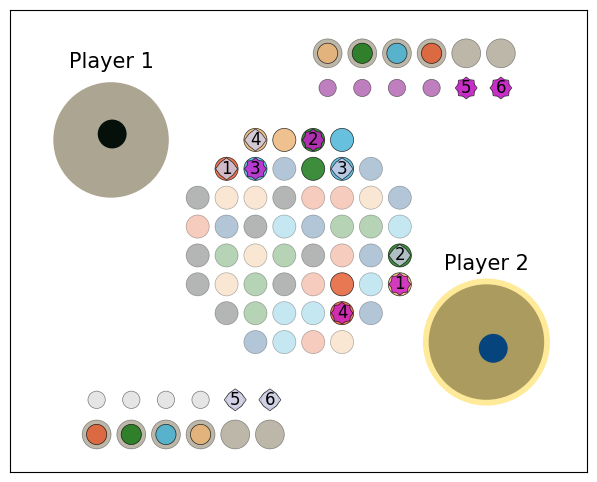

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (17, 16)
Possible actions are: [10, 11, 14, 23, 24, 27, 28, 31, 32, 34, 35, 36, 42, 43, 51]
Action taken is: 27
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


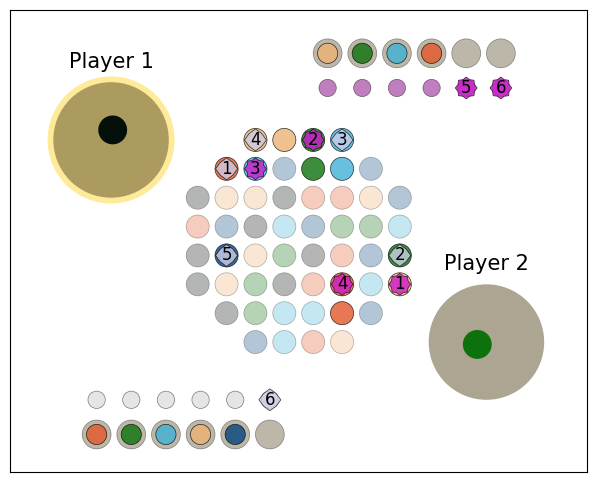

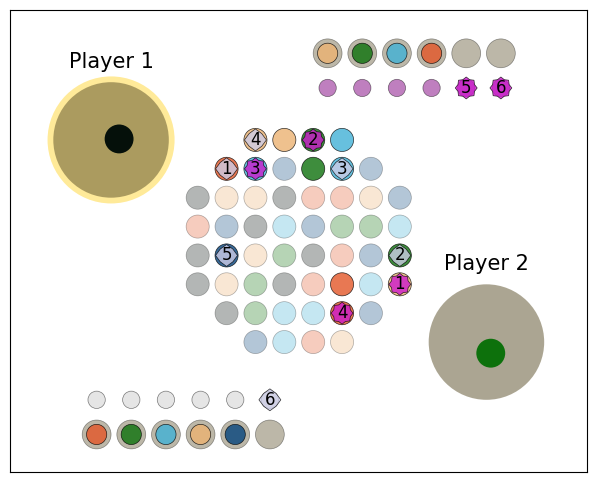

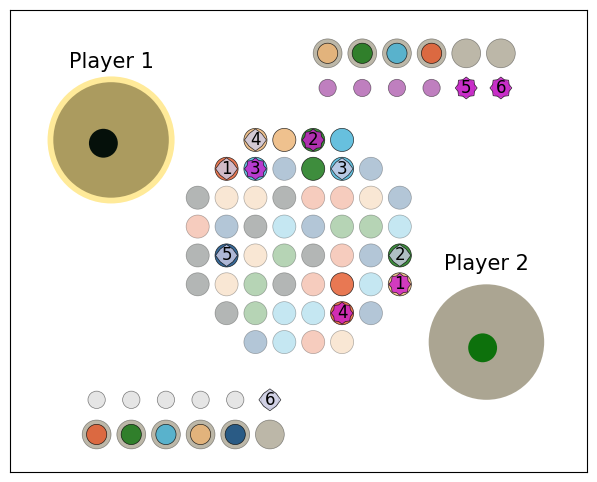

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (16, 22)
Possible actions are: [10, 11, 14, 29, 30, 32, 34, 35, 36, 40, 42, 43, 50, 83, 90]
Action taken is: 30
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


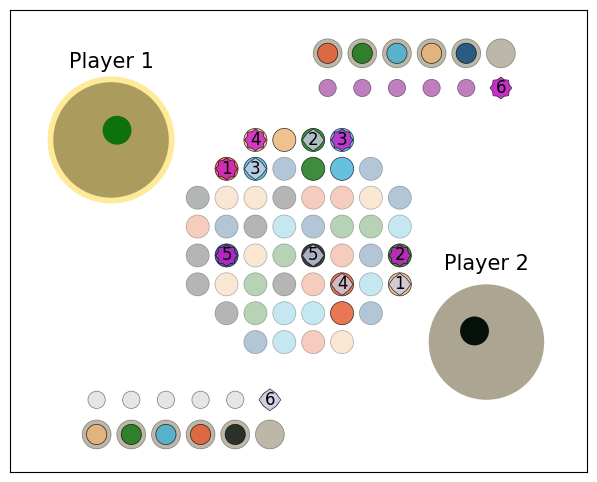

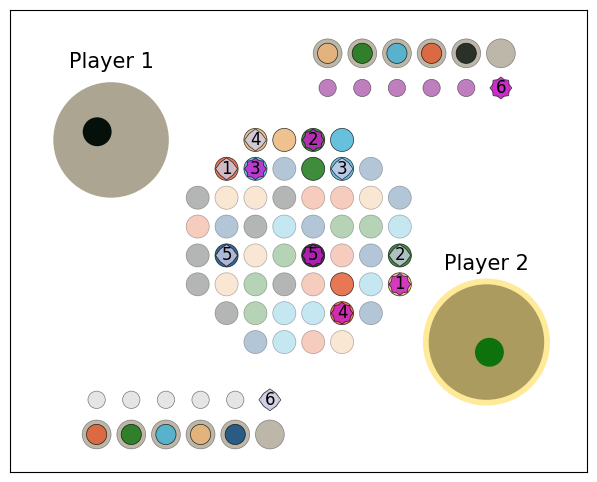

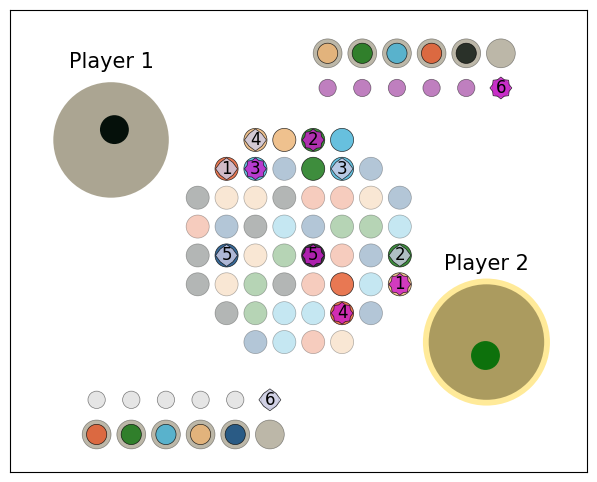

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (22, 21)
Possible actions are: [25, 32, 71]
Action taken is: 32
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


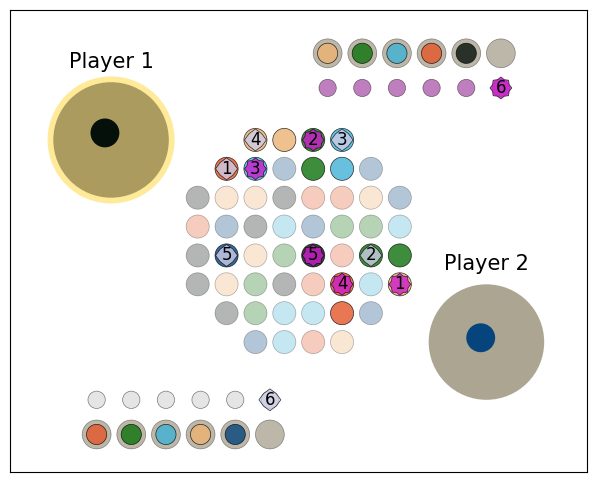

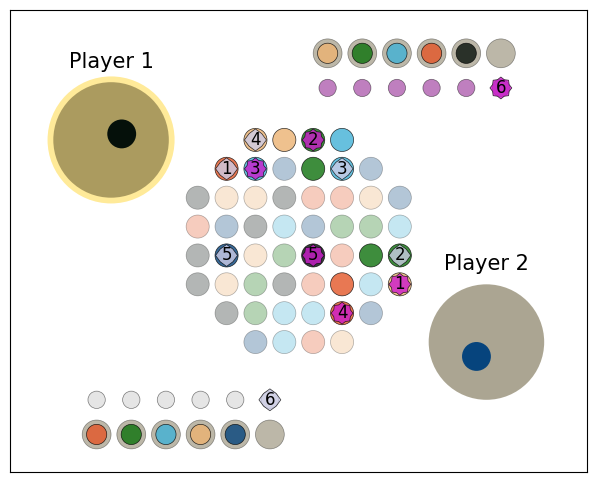

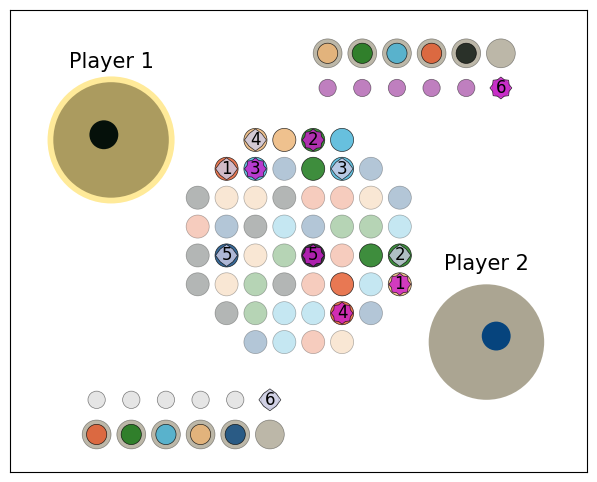

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (21, 24)
Possible actions are: [22, 29, 31, 38, 83, 90]
Action taken is: 22
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


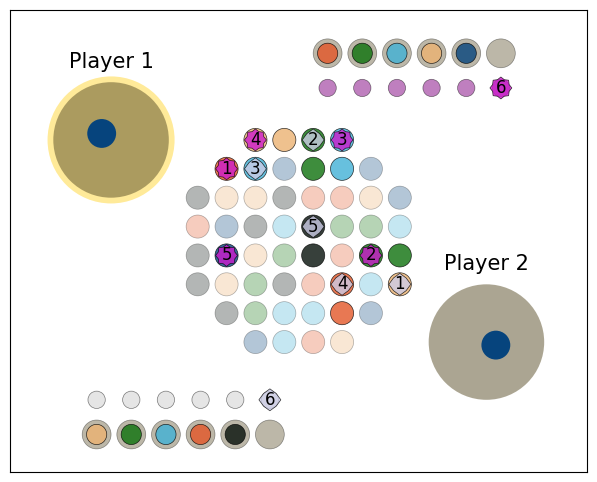

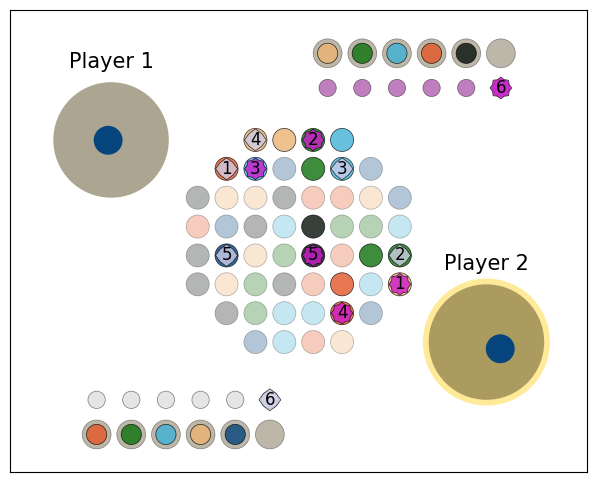

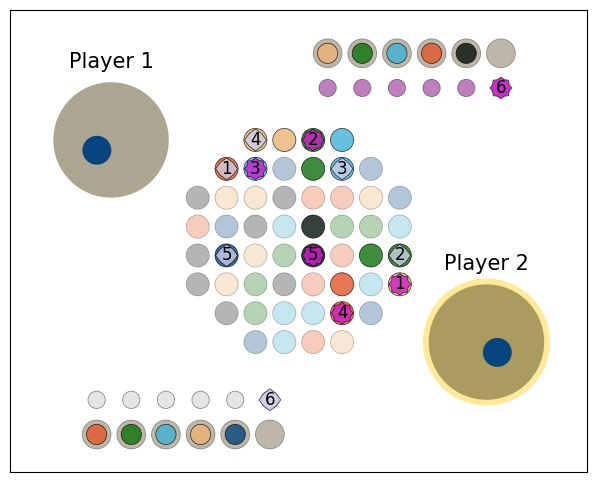

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (24, 26)
Possible actions are: [19, 26, 28, 35, 76]
Action taken is: 19
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


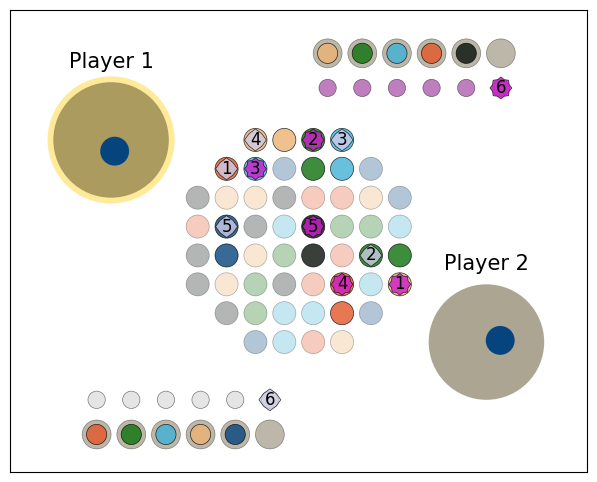

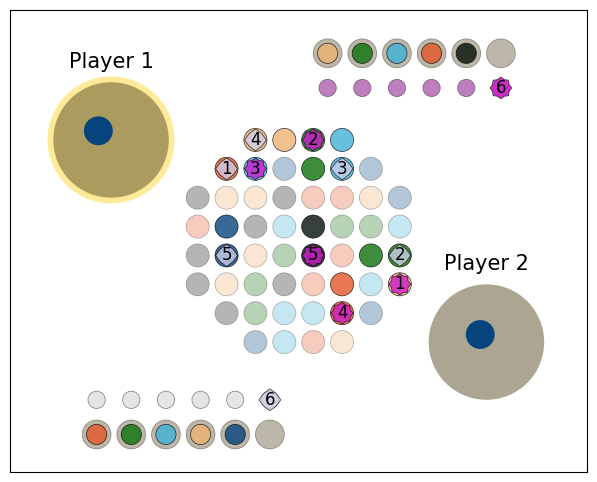

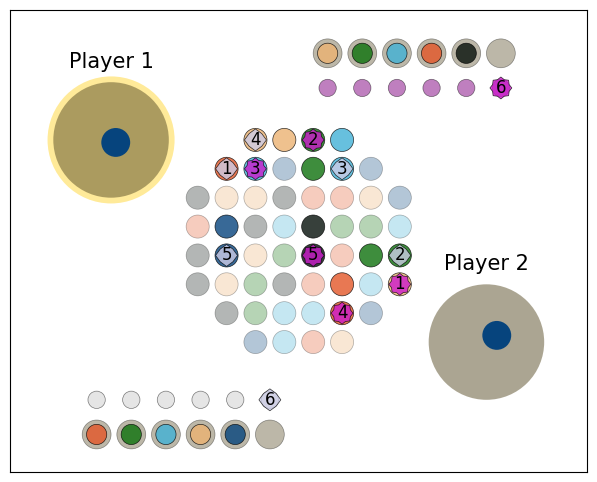

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (26, 29)
Possible actions are: [10, 14, 16, 17, 24, 25, 34, 36, 38, 42, 43, 44, 51, 83, 90]
Action taken is: 16
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


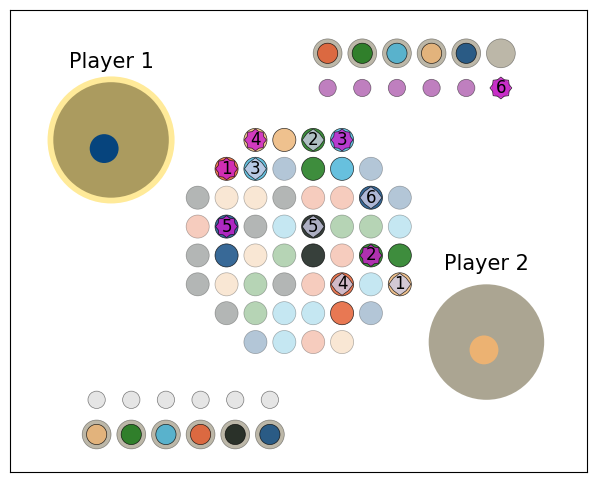

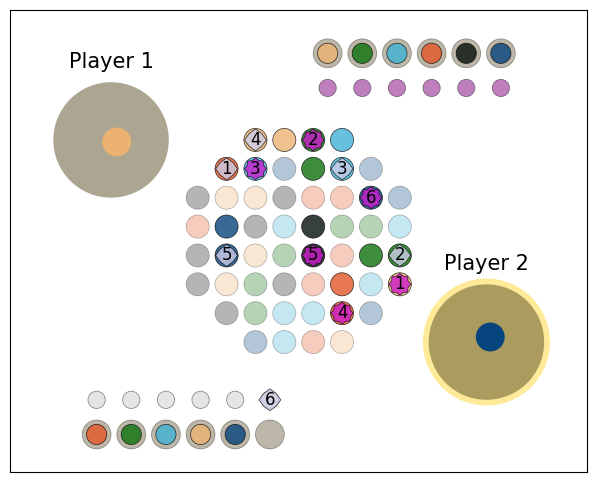

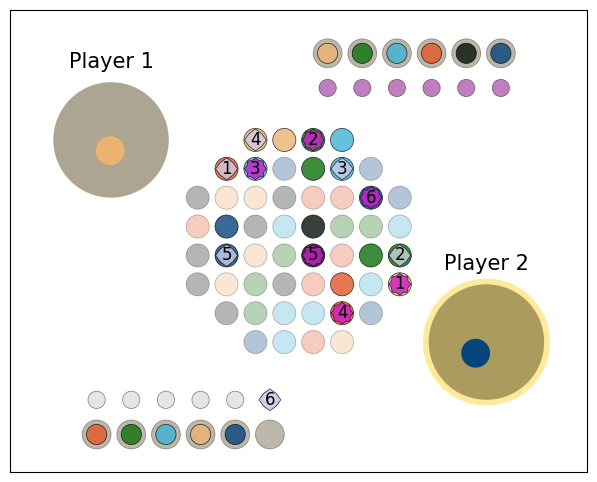

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (29, 32)
Possible actions are: [11, 18, 20, 26, 28, 35, 76]
Action taken is: 20
Difference in tensors is 9.5367431640625e-07
~~~~~~~~~~~~~~~~~~~~~~~~


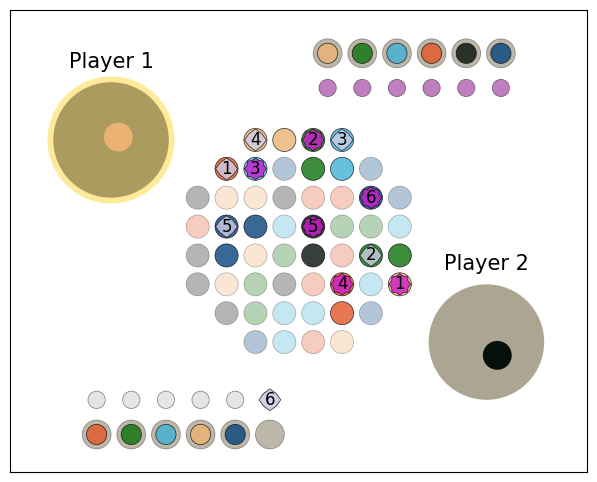

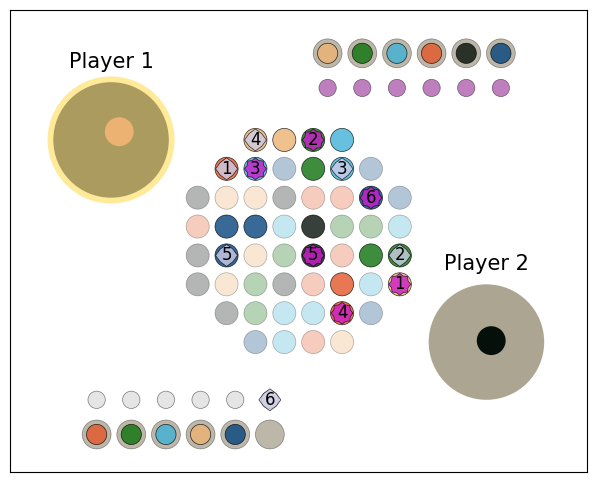

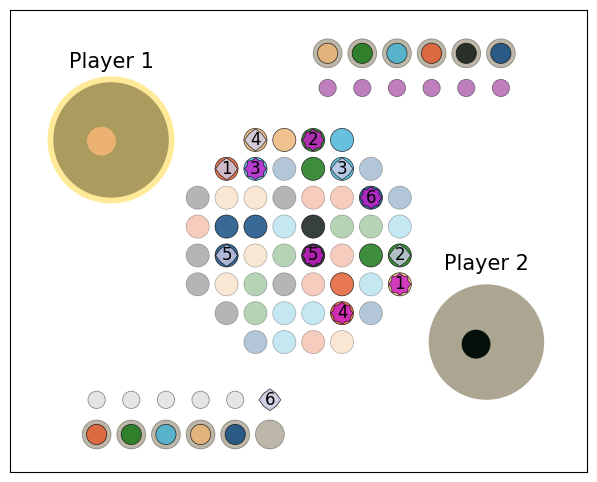

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (32, 34)
Possible actions are: [40, 61, 69, 83, 90]
Action taken is: 40
Difference in tensors is 9.5367431640625e-07
~~~~~~~~~~~~~~~~~~~~~~~~


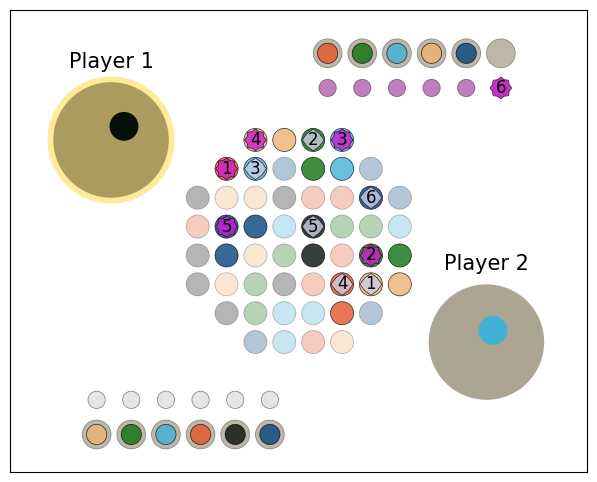

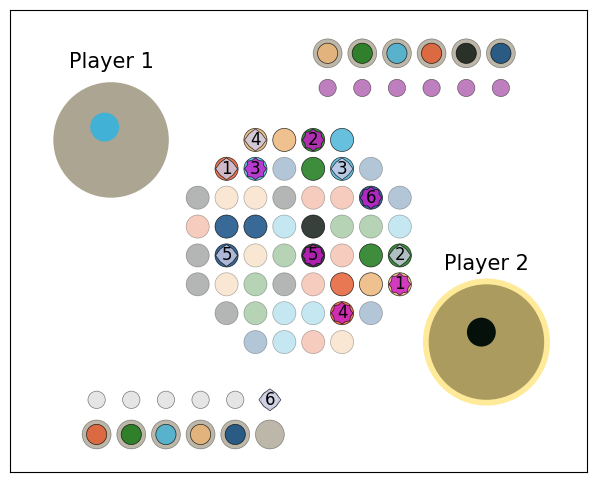

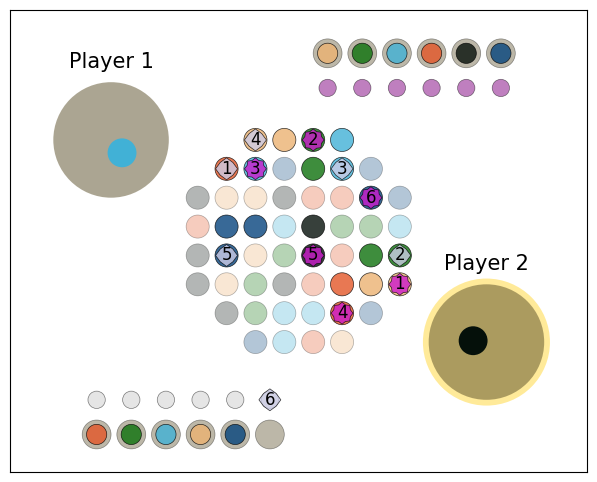

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (34, 33)
Possible actions are: [6, 10, 11, 15, 24, 28, 34, 35, 36, 42, 43, 45, 48, 51, 76]
Action taken is: 45
Difference in tensors is 1.9073486328125e-06
~~~~~~~~~~~~~~~~~~~~~~~~


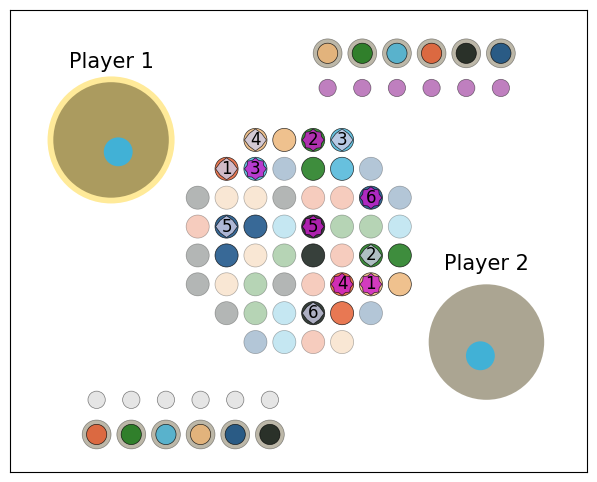

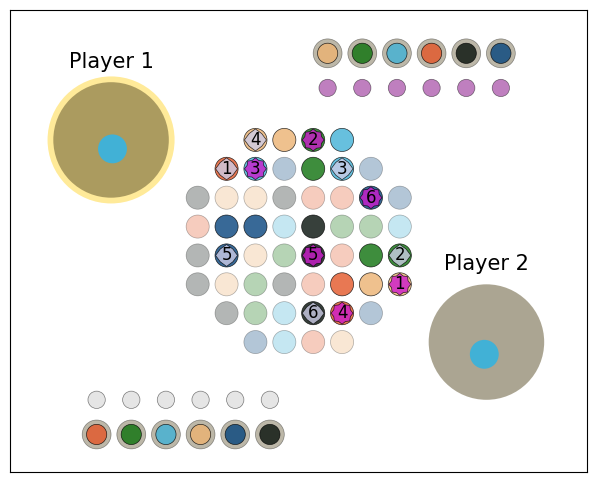

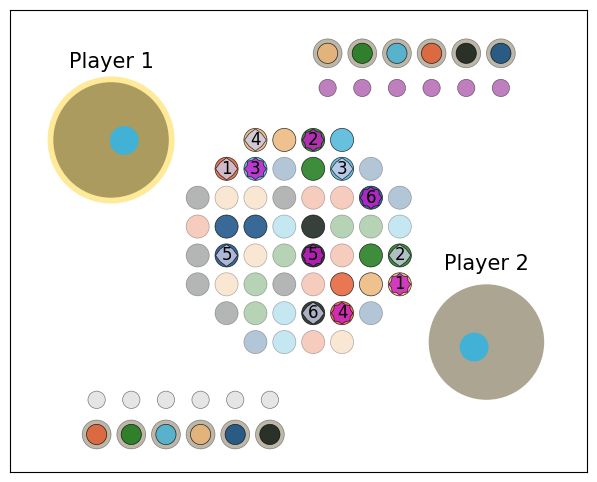

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (33, 40)
Possible actions are: [6, 12, 61, 69, 83, 90]
Action taken is: 12
Difference in tensors is 1.9073486328125e-06
~~~~~~~~~~~~~~~~~~~~~~~~


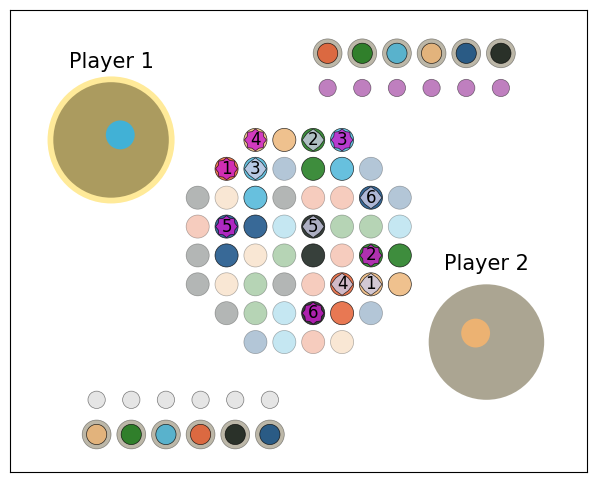

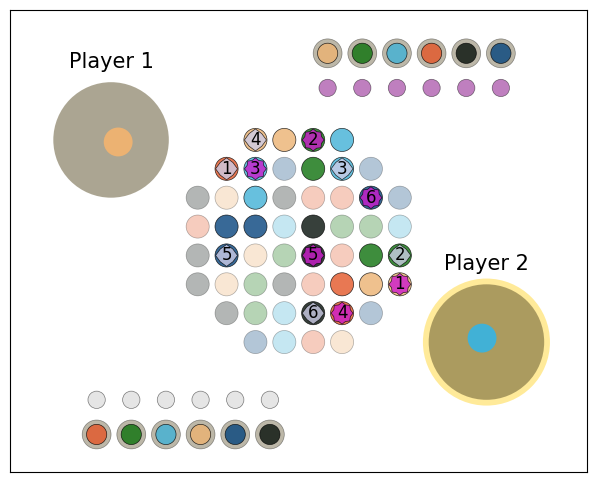

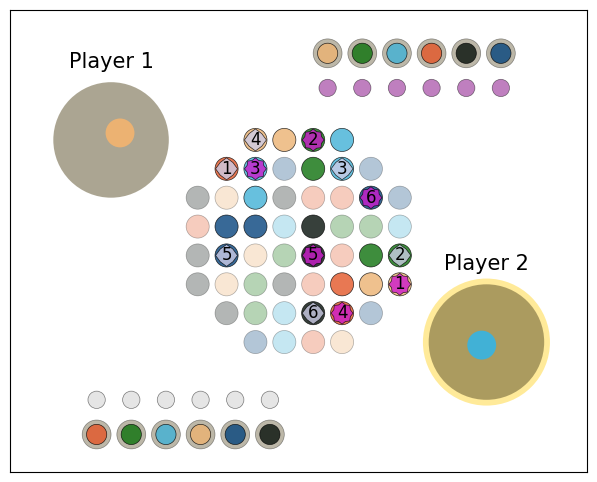

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (40, 36)
Possible actions are: [9, 15, 76]
Action taken is: 9
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


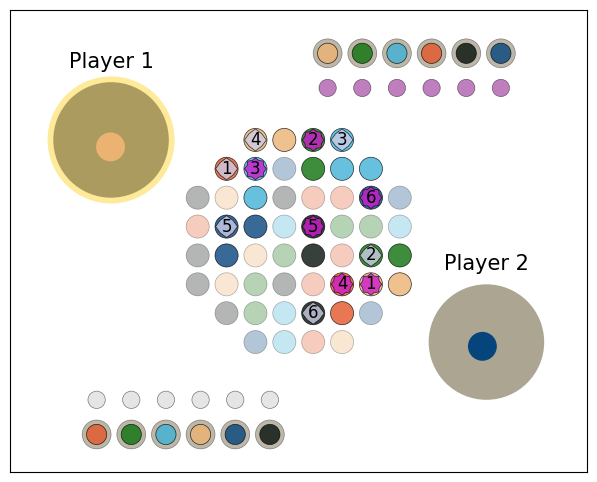

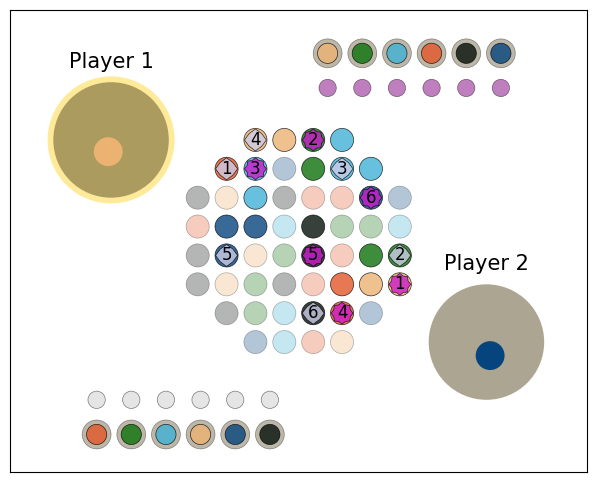

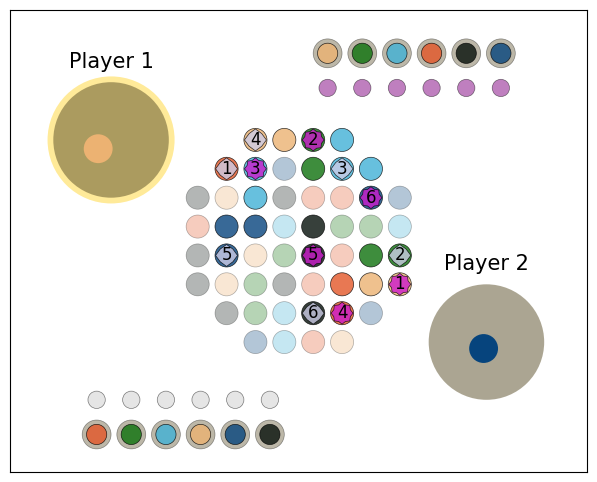

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (36, 43)
Possible actions are: [47, 69, 83, 90]
Action taken is: 47
Difference in tensors is 9.5367431640625e-07
~~~~~~~~~~~~~~~~~~~~~~~~


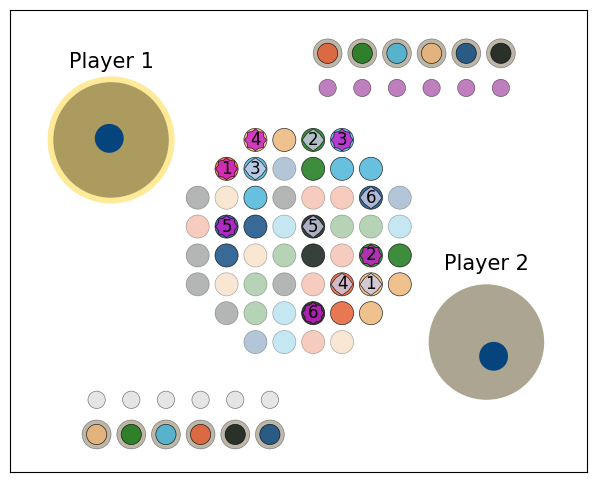

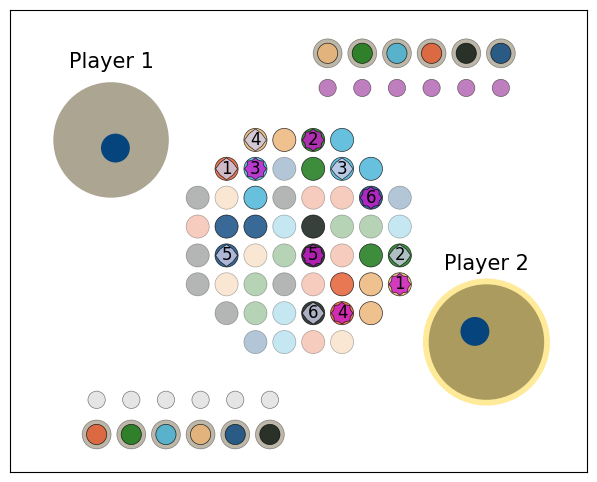

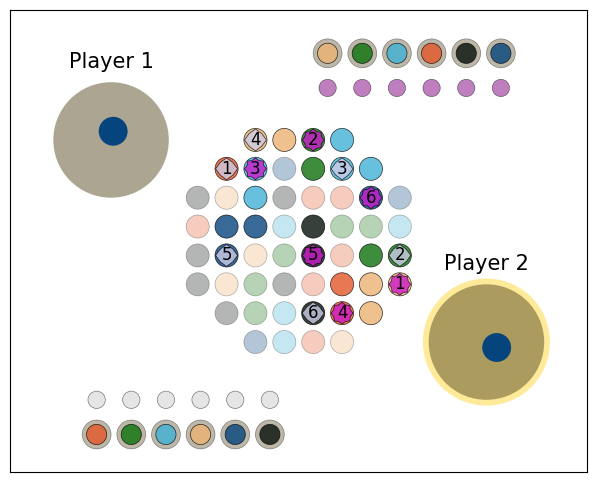

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (43, 37)
Possible actions are: [11, 18, 21, 26, 28, 35, 76]
Action taken is: 18
Difference in tensors is 9.5367431640625e-07
~~~~~~~~~~~~~~~~~~~~~~~~


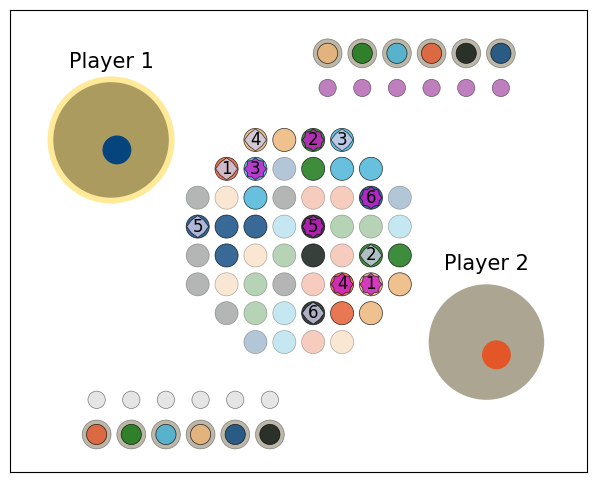

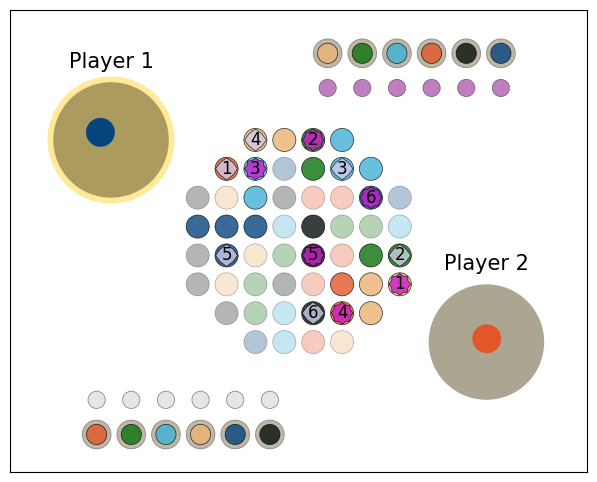

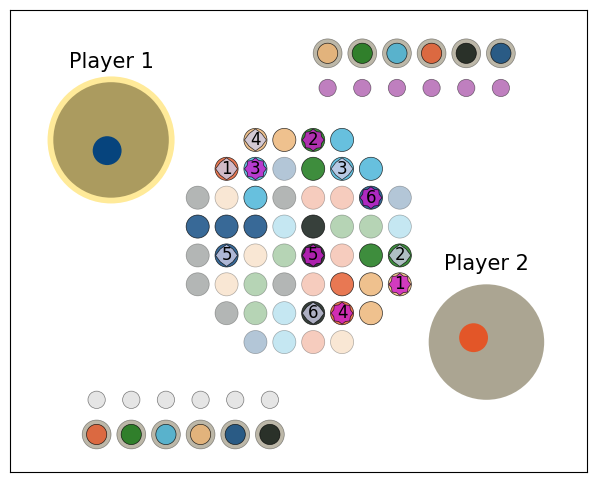

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (37, 48)
Possible actions are: [15, 17, 24, 83, 90]
Action taken is: 24
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


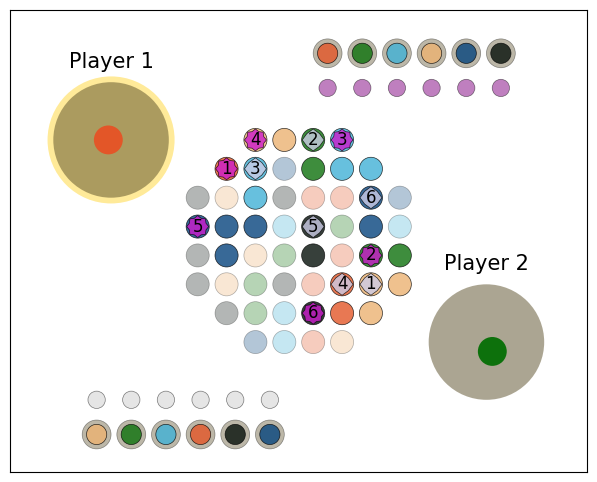

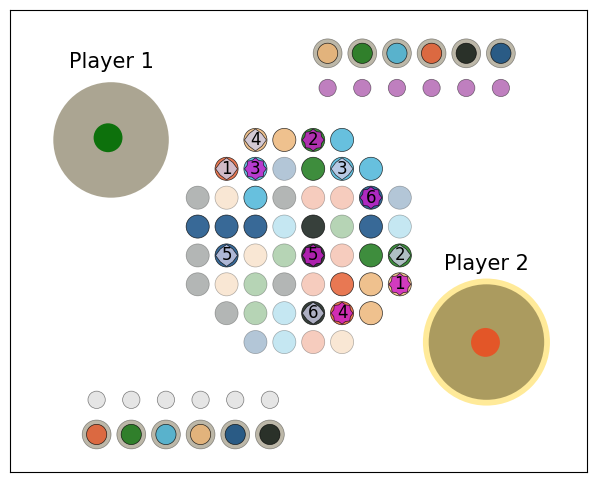

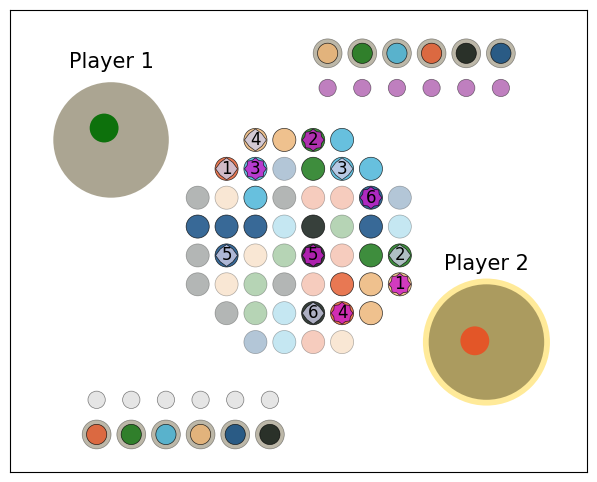

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (48, 43)
Possible actions are: [11]
Action taken is: 11
Difference in tensors is 0.0
~~~~~~~~~~~~~~~~~~~~~~~~


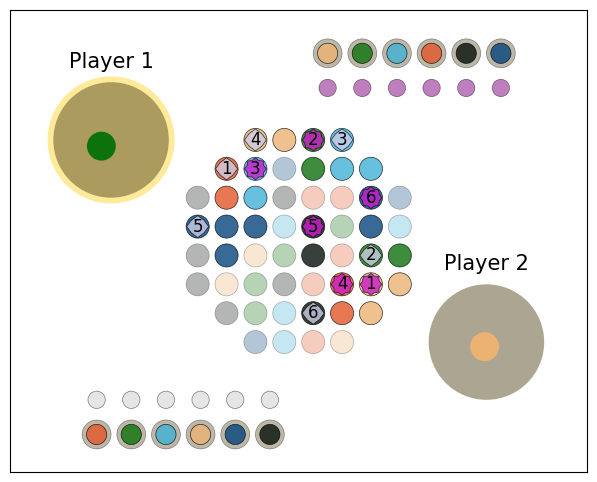

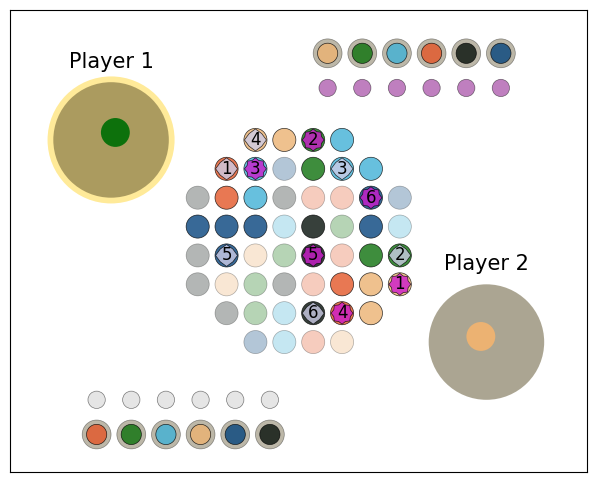

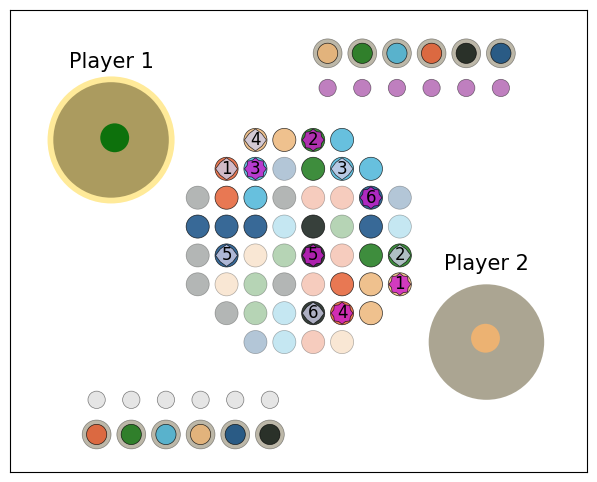

~~~~~~~~~~~~~~~~~~~~~~~~
Score is: (43, 49)
Possible actions are: [6, 14, 69, 83, 90]
Action taken is: 6
Difference in tensors is 601.3067016601562
~~~~~~~~~~~~~~~~~~~~~~~~


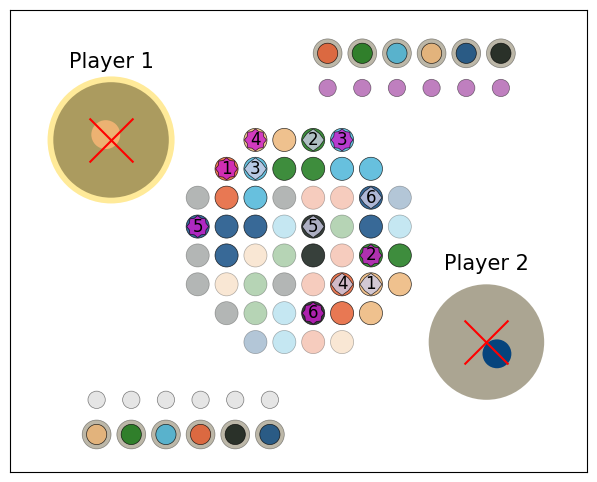

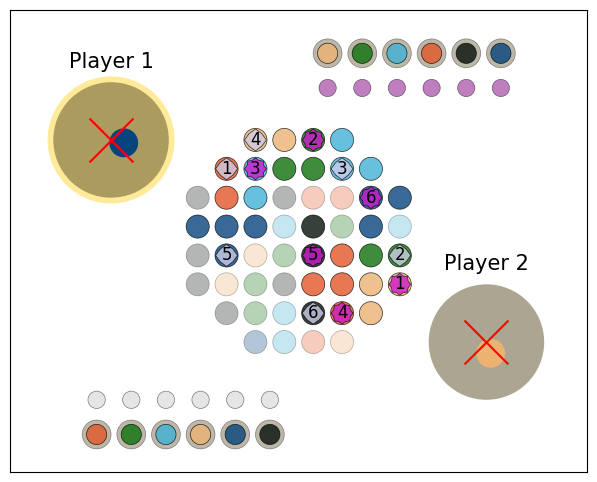

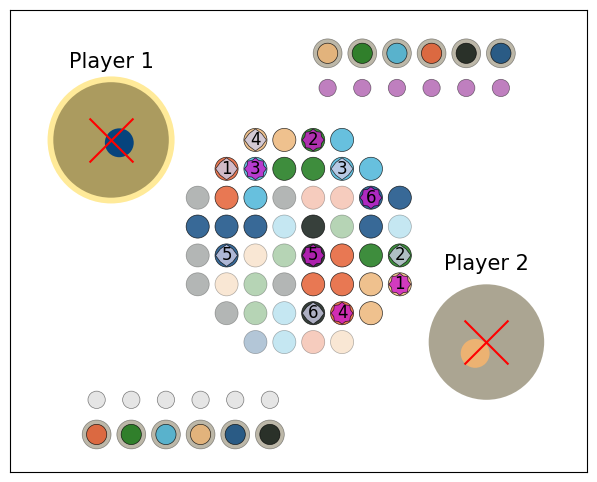

In [18]:
_node = copy.deepcopy(donottouch_topnode)
fsz = (9, 6)

for _arg in parent_action_arguments[::-1]:
    ### details on the game before the move:
    _score = _node.game.calculate_score()
    _actions = copy.deepcopy(_node.possible_actions)
    _chosen_action = copy.deepcopy(_node.possible_actions[_arg])
    
    ### create a new node for the tensor state version:
    new_node = Node(parent_action_arg = _arg,
                    parent = _node)
    new_node.create_tensor_state()
    aug = StateAugmentor(new_node.tensor_state)
    tensor_game = aug.create_game_from_state()
    
    pplotter1 = PatternPlotter(tensor_game)

    ### step an actual game:
    actual_game = copy.deepcopy(_node.game)
    actual_game.step(_chosen_action)
    pplotter3 = PatternPlotter(actual_game)
    
    ### step the original game:
    _node = _node.children[_arg]

    pplotter2 = PatternPlotter(_node.game)
    
    check_tensor_state = create_tensor_state(copy.deepcopy(_node.game))
    
    ### compare the tensor states!:
    
    diff = np.abs(new_node.tensor_state - check_tensor_state).sum()

    print(f"~~~~~~~~~~~~~~~~~~~~~~~~")
       
    print(f"Score is: {_score}")
    print(f"Possible actions are: {sorted(_actions)}")
    print(f"Action taken is: {_chosen_action}")
    print(f"Difference in tensors is {diff}")
    print(f"~~~~~~~~~~~~~~~~~~~~~~~~")

    ### plot the three ways to display the same game:
    pplotter1.plot(fig_size=fsz)
    pplotter2.plot(fig_size=fsz)
    pplotter3.plot(fig_size=fsz)

    ### if you find a significant difference in the two tensors:
    if diff > 1e-5:
        break


In [ ]:

# update each of the types of tensor slice in turn:
_node._tensor_update_no_more_placing(numpy_state, parent_action)
_node._tensor_update_board(numpy_state, parent_action)
_node._tensor_update_bowl_tokens(numpy_state, parent_action)
_node._tensor_update_color_order(numpy_state, parent_action)
_node._tensor_update_score(numpy_state, parent_action)
_node._tensor_update_bowl_token_values(numpy_state, parent_action)

In [ ]:
parent = copy.deepcopy(_node.parent)
parent_tensor = parent.tensor_state
parent_action = parent.possible_actions[_node.parent_action_arg]                                                                                                      
game = parent.game

In [ ]:
next_game = copy.deepcopy(game)
next_game.step(parent_action)
pplotter = PatternPlotter(next_game)
pplotter.plot()

In [ ]:
pplotter = PatternPlotter(game)
pplotter.plot()



In [ ]:
active_score = 50.
passive_score = 75.

score_tensor = torch.tensor([active_score / 150., passive_score / 150.]).view(2, 1, 1).expand(2, 8, 8)
print(score_tensor.shape, score_tensor[0], score_tensor[1])


In [ ]:
active_value = 6.
passive_value = 1.
token_value_tensor = torch.tensor([active_value / 6.0, passive_value / 6.0]).view(2, 1, 1).expand(2, 8, 8)
token_value_tensor[0], token_value_tensor[1]

In [ ]:
place_bool = True
placing_tensor = torch.tensor([int(place_bool)]).view(1, 1, 1).expand(1, 8, 8)
placing_tensor

In [ ]:
 # 36 channels for each player for color group: order mapping:

aorder = [0, 1, 0, 2, 0, 3]
porder = [1, 3, 5, 4, 0, 2]

order_tensor = torch.zeros((8, 8, 12), dtype=torch.float)
order_values = torch.tensor(aorder + porder, dtype=torch.float) / 6.0 # normalize to between 0.0 and 1.0:
order_tensor[:, :, range(12)] = order_values

In [ ]:
def profile_torch_1(n):
    for _ in range(n):
        order_tensor = torch.zeros((8, 8, 12), dtype=torch.float)
        order_values = torch.tensor(aorder + porder, dtype=torch.float) / 6.0 # normalize to between 0.0 and 1.0:
        order_tensor[:, :, range(12)] = order_values

In [ ]:
order_tensor2 = torch.tensor(aorder + porder).view(12, 1, 1).expand(12, 8, 8)

In [ ]:
def profile_torch_2(n):
    for _ in range(n):
        order_list = [_or / 6.0 for _or in (aorder + porder)]
        order_tensor2 = torch.tensor(order_list).view(12, 1, 1).expand(12, 8, 8)



In [ ]:
atoken = 5
ptoken = 0

bowl_tensor = torch.nn.functional.one_hot(
    torch.tensor([atoken, ptoken + 6]).long(), num_classes=12
).sum(dim=0).view(12, 1, 1).expand(12, 8, 8)

bowl_list = [0] * 12
bowl_list[atoken] = 1
bowl_list[ptoken + 6] = 1
bowl_tensor2 = torch.tensor(bowl_list).view(12, 1, 1).expand(12, 8, 8)

bowl_tensor, bowl_tensor2

In [ ]:
board = np.random.randint(low=0, high=18, size=(8, 8))


In [ ]:
board.flatten()

In [ ]:

board_tensor = torch.nn.functional.one_hot(
        torch.tensor(board).long(), num_classes=19)[:, :, :-1].permute(2, 0, 1)

In [ ]:
eye = torch.eye(19, dtype=torch.int)[:-1]  # shape (18, 19)
board_tensor2 = eye.index_select(1, torch.tensor(board).long().flatten())  # shape (18, 64)
board_tensor2 = board_tensor2.view(18, 8, 8)  # now in (C, H, W)

In [ ]:
ind = 2
board_tensor[ind], board_tensor2[ind]

In [ ]:
def prof_board_1(n):
    for _ in range(n):
        board_tensor = torch.nn.functional.one_hot(
        torch.tensor(board).long(), num_classes=19)[:, :, :-1].permute(2, 0, 1)

eye = torch.eye(19, dtype=torch.int)[:-1]  # shape (18, 19)

def prof_board_2(n):
    for _ in range(n):
        board_tensor2 = eye.index_select(1, torch.tensor(board).long().flatten())  # shape (18, 64)
        board_tensor2 = board_tensor2.view(18, 8, 8)  # now in (C, H, W)

In [ ]:
%prun prof_board_1(100000)

In [ ]:
%prun prof_board_2(100000)

In [ ]:
for ind in range(12):
    print(order_tensor[:, :, ind], order_tensor2[ind])

In [ ]:
### directory for bad data discovered:

debug_dir = os.path.join(Path.cwd(), 'saved_games', 'v4', 'validation')
debug_path = random.choice(os.listdir(debug_dir))
debug_data_location = os.path.join(debug_dir, debug_path)

with open(debug_data_location, mode='rb') as f:
    debug_data = pickle.load(f)
    

In [ ]:
### isolate the specific game:

debug_state = -1
debug_index = 1720  #991

### tensor state, full visit counts, distance from etnd etc.
debug_instance = debug_data[debug_state][debug_index]


In [ ]:
### make sure that you still see the bug here in a clean env:
debug_augmentor = StateAugmentor(state=debug_instance[0])
debug_game = debug_augmentor.create_game_from_state()

debug_plotter = PatternPlotter(debug_game)
debug_plotter.plot()
print(np.where(debug_instance[1]))
print(debug_game.calculate_score())

# Okay!!! So the base data looks quite good actually. Is it a problem elsewhere?

In [ ]:
### load a trainer which is where we first saw the bug:
net_location = os.path.join(Path.cwd(), 'saved_networks', 'v4', '2025_07_11_15_25.pt')

# create shell networks:
debug_net = PatternsNet(in_channels=47, out_channels=128)
debug_net.load_state_dict(torch.load(net_location, weights_only=True))

# assign to trainer class: (do we want to avoid assigning the network?)
debug_trainer = PatternTrainer(network=debug_net, device=my_device)

debug_data = PatternTrainer.load_data(
    
debug_win_tuple, debug_loss_tuple, debug_draw_tuple = debug_trainer.validate(debug_data_location,
                                                                             num_check = 10000,
                                                                             is_augment = True)


In [ ]:
debug_win_tuple[0][991]

In [ ]:
validation_games = debug_trainer.load_data(debug_data_location)


In [ ]:
my_game = copy.deepcopy(validation_games[1][991])
relevant_state, relevant_vcs = my_game[0], my_game[1]
auged = StateAugmentor(relevant_state, relevant_vcs)
  
new_game = auged.create_game_from_state()

my_plotter = PatternPlotter(new_game)
my_plotter.plot()

print(np.where(relevant_vcs))
    